# Project Context: From Network Traffic to Video QoE  

Video streaming (like YouTube) makes up the **majority of today’s Internet traffic**, and ensuring a smooth viewing experience has become a key concern for both platforms and network operators. When we talk about **Quality of Experience (QoE)**, we mean things like: *Did the video start quickly? Did it play at a good resolution? Were there buffering stalls?*  

The challenge is that today most video traffic is **encrypted** (HTTPS, QUIC). This prevents operators from directly observing application-level details such as resolution or number of stalls. What they can realistically access are only **network-level signals** like throughput, packet sizes, timing, loss, and jitter.  

This project explores whether we can use **machine learning** to bridge that gap: can we **predict user-perceived QoE** from **network- and packet-level data alone**?  

---

## How the dataset was built  

- The authors ran **controlled YouTube streaming experiments** where they emulated different network conditions.  
- The parameters they varied included:  
  1. Downlink and uplink bandwidth  
  2. Round-trip time (RTT / latency)  
  3. Packet loss rate  
  4. Jitter (delay variation)  

- For each video session, they collected:  
  - **Ground-truth QoS conditions** (the emulator settings).  
  - **Player features** (resolutions streamed, bitrate levels, quality switches up/down).  
  - **Packet-level statistics** (sizes, interarrival times, burstiness, throughput patterns) — the kind of data an ISP could observe from encrypted traffic.  
  - **QoE outcomes**:  
    - Startup delay (`join_time`)  
    - Number of stalls (`stallingNumber`)  
    - Total stall duration (`totalStallDuration`)  
    - Video quality/resolution trajectory  
    - MOS (Mean Opinion Score), estimated using different ITU models (`QoE_ITU_023`, `035`, `046`) on a 1–5 scale  

This produced a **large dataset (~100k video sessions)** linking **network conditions and traffic stats** to **QoE outcomes**.  

---

## What we can do with it  

Because the dataset spans multiple layers (network → player → QoE), there are many possible tasks:  
- Predict whether a session will **stall** (classification).  
- Predict the **startup delay** or **stall duration** (regression).  
- Predict the **MOS score** with different ITU models.  
- Compare **different feature sets**:  
  - Using all available info (network + player features).  
  - Using only what an ISP/operator could realistically see (packet-level stats), to test how close they can get to inferring QoE from encrypted traffic.  

In [ ]:
from google.colab import drive
import os

import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


Libraries are imported

In [ ]:

# Mount Google Drive
drive.mount('/content/drive')

# just edit this path to where your files are
BASE_PATH = "/content/drive/MyDrive/ML Project data/material"

COLUMNS_PATH = os.path.join(BASE_PATH, "column-names.txt")
DATA_PATH = os.path.join(BASE_PATH, "dataset.csv")

print("Columns file:", COLUMNS_PATH)
print("Data file:", DATA_PATH)


Mounted at /content/drive
Columns file: /content/drive/MyDrive/ML Project data/material/column-names.txt
Data file: /content/drive/MyDrive/ML Project data/material/dataset.csv


This ensures that we get access to the database that is in a google drive


In [ ]:
def parse_column_names(path):
    names = []
    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        for line in f:
            line = line.strip("\n")
            if line.startswith("|"):  # SQL-style ascii table
                parts = [x.strip() for x in line.split("|")]
                if len(parts) >= 2 and parts[1] not in ("Field", "Type", "Null", "Key", "Default", "Extra", ""):
                    names.append(parts[1])
            elif line and not line.startswith("+") and not line.startswith("-"):
                token = line.strip()
                if token and all(c.isalnum() or c in ("_",) for c in token):
                    names.append(token)
    seen, unique = set(), []
    for n in names:
        if n not in seen:
            unique.append(n)
            seen.add(n)
    return unique

col_names = parse_column_names(COLUMNS_PATH)
print(f"Found {len(col_names)} column names.")
print(col_names[:20])

Found 270 column names.
['videoID', 'category', 'bitrates_144p', 'bitrates_240p', 'bitrates_360p', 'bitrates_480p', 'bitrates_720p', 'bitrates_1080p', 'join_time', 'stallingNumber', 'totalStallDuration', 'outbandQoS_DL_TP', 'outbandQoS_UL_TP', 'outbandQoS_RTT', 'outbandQoS_RTT_STD', 'outbandQoS_LOSS', 'pcapStats_stats_avg_DL_TP', 'pcapStats_stats_avg_UL_t', 'pcapStats_stats_avg_DL_t', 'pcapStats_stats_avg_DL_pkt']


Here we just parsed all the cloumns to find out what we are working with

In [ ]:
df = pd.read_csv(DATA_PATH, header=None, names=col_names, low_memory=False)
print("Shape:", df.shape)
df.head(3)

Shape: (111919, 270)


,videoID,category,bitrates_144p,bitrates_240p,bitrates_360p,bitrates_480p,bitrates_720p,bitrates_1080p,join_time,stallingNumber,...,QoE_JT,QoE_noStall,QoE_noSwitches,QoE_Linear,QoE_Linear2,QoE_Linear3,QoE_LD_SD_HD,QoE_ITU_023,QoE_ITU_035,QoE_ITU_046
0,NeZ8BQBl8NA,Film & Animation,67101,63551,123054,205503,422644,824186,3411,0,...,1,0,0,5.0,5.0,5.0,2,5.0,4.44397,4.42413
1,FWpRqKpV0rY,Education,76305,111936,204952,340239,744420,1683577,2883,0,...,1,0,0,5.0,5.0,5.0,2,5.0,4.61882,4.58419
2,n72yt5hc3-A,Travel & Events,91757,123729,195255,303189,682584,1385367,4803,0,...,1,0,0,5.0,5.0,5.0,2,5.0,4.58990,4.55993


We created the panda dataframe

In [ ]:
na_counts = df.isna().sum().sort_values(ascending=False)
na_counts

,0
category,3
pcapStats_first30sec_DLTP_t20,0
pcapStats_first30sec_DLTP_t19,0
pcapStats_first30sec_DLTP_t18,0
pcapStats_first30sec_DLTP_t17,0
...,...
pcapStats_temporal_DLTP_t24,0
pcapStats_temporal_DLTP_t23,0
pcapStats_temporal_DLTP_t22,0
pcapStats_temporal_DLTP_t21,0


and then looked at the temporal stats that can be removed for efficiency

In [ ]:
# --- Step 1: Identify likely target columns ---
targets = [
    "join_time", "stallingNumber", "totalStallDuration","QoE_ITU_046"
]
print("QoE target columns:", targets)

# --- Step 2: Out-of-band QoS (ground-truth emulator settings) ---
outband_cols = [
    "outbandQoS_DL_TP", "outbandQoS_UL_TP",
    "outbandQoS_RTT", "outbandQoS_RTT_STD", "outbandQoS_LOSS"
]
print("Outband QoS columns:", outband_cols)

# --- Step 3: In-band packet-level stats ---
pcap_stat_cols = [c for c in df.columns if c.startswith("pcapStats_stats_")]
pcap_temp_cols = [c for c in df.columns if c.startswith("pcapStats_temporal_")]
pcap_first30_cols = [c for c in df.columns if c.startswith("pcapStats_first30sec_")]

print("Packet-level stats:", len(pcap_stat_cols))
print("Temporal features:", len(pcap_temp_cols))
print("First-30sec features:", len(pcap_first30_cols))

# --- Step 4: Chunk/segment features ---
chunk_cols = [c for c in df.columns if re.search(r'chunk|chunks|_size|_dur', c, re.I)]
print("Chunk-related columns (examples):", chunk_cols[:10])

# --- Step 5: Content/bitrate features ---
content_cols = [
    "category", "bitrates_144p", "bitrates_240p", "bitrates_360p",
    "bitrates_480p", "bitrates_720p", "bitrates_1080p"
]
print("Content-related columns:", content_cols)

# --- Step 6: Starter features (compact, high-signal subset) ---
starter_features = [
    # QoS
    "outbandQoS_DL_TP", "outbandQoS_UL_TP", "outbandQoS_RTT",
    "outbandQoS_RTT_STD", "outbandQoS_LOSS",
    # A few packet-level stats
    "pcapStats_stats_avg_DL_TP", "pcapStats_stats_std_DL_TP",
    "pcapStats_stats_p90_DL_TP", "pcapStats_stats_avg_DL_t",
    "pcapStats_stats_avg_DL_pkt",
    # Chunk stats
    "videoChunkSizesHTTP_avg", "videoChunkSizesHTTP_std",
    "audioChunkSizesHTTP_avg", "audioChunkSizesHTTP_std",
    # Content heaviness
    "bitrates_720p", "bitrates_1080p"
]
print("Starter features:", starter_features)

# --- Step 7: sampling ---
USE_SAMPLE = True
SAMPLE_N = 100000
df_s = df.sample(n=min(SAMPLE_N, len(df)), random_state=42) if USE_SAMPLE else df
print("Working with rows:", len(df_s))


QoE target columns: ['join_time', 'stallingNumber', 'totalStallDuration', 'QoE_ITU_046']
Outband QoS columns: ['outbandQoS_DL_TP', 'outbandQoS_UL_TP', 'outbandQoS_RTT', 'outbandQoS_RTT_STD', 'outbandQoS_LOSS']
Packet-level stats: 48
Temporal features: 100
First-30sec features: 30
Chunk-related columns (examples): ['numberOfVideoChunks', 'numberOfAudioChunks', 'ratioOfChunksHTTP', 'videoChunkSizesHTTP_avg', 'videoChunkSizesHTTP_std', 'videoChunkSizesHTTP_min', 'videoChunkSizesHTTP_max', 'videoChunkSizesHTTP_p25', 'videoChunkSizesHTTP_p50', 'videoChunkSizesHTTP_p75']
Content-related columns: ['category', 'bitrates_144p', 'bitrates_240p', 'bitrates_360p', 'bitrates_480p', 'bitrates_720p', 'bitrates_1080p']
Starter features: ['outbandQoS_DL_TP', 'outbandQoS_UL_TP', 'outbandQoS_RTT', 'outbandQoS_RTT_STD', 'outbandQoS_LOSS', 'pcapStats_stats_avg_DL_TP', 'pcapStats_stats_std_DL_TP', 'pcapStats_stats_p90_DL_TP', 'pcapStats_stats_avg_DL_t', 'pcapStats_stats_avg_DL_pkt', 'videoChunkSizesHTTP_avg

This is what we are working with

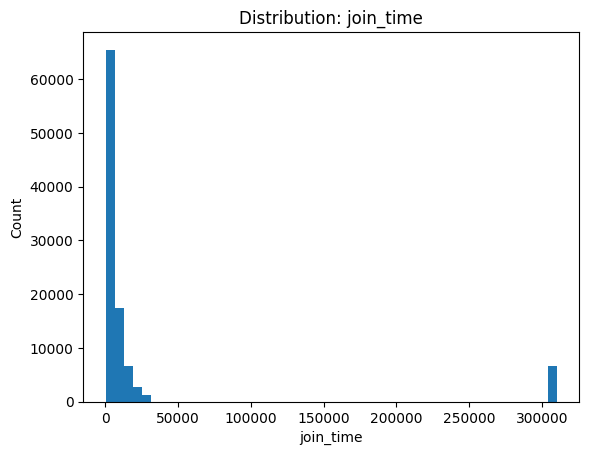

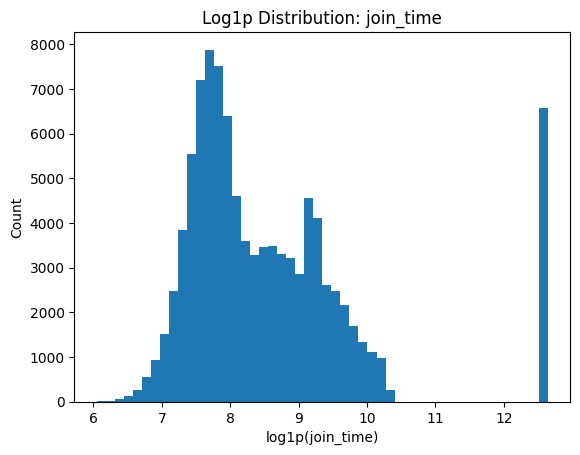

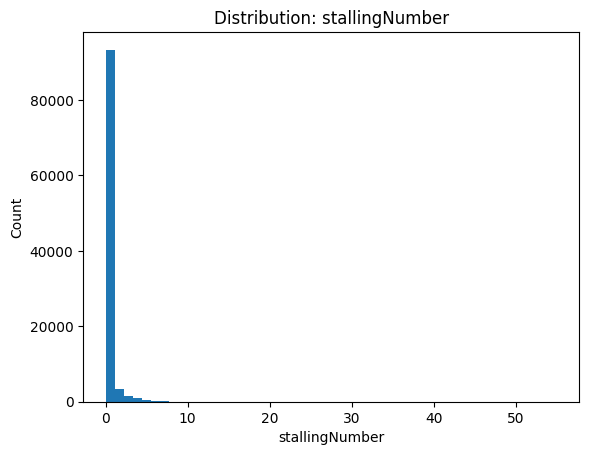

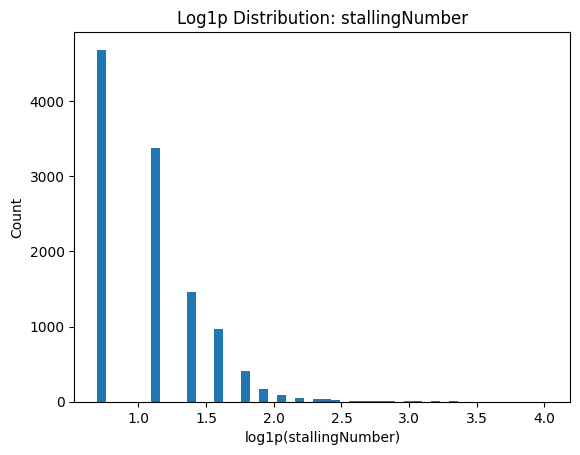

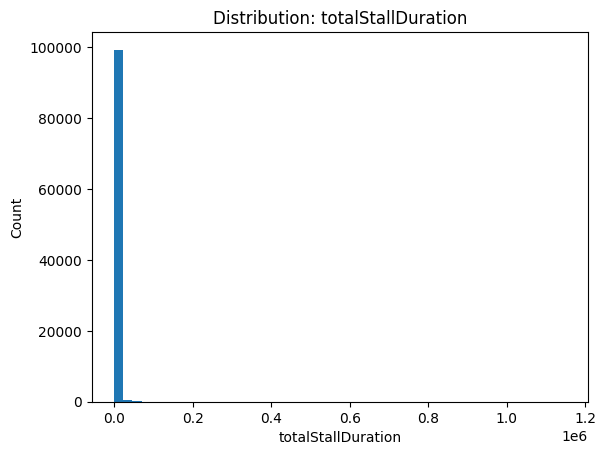

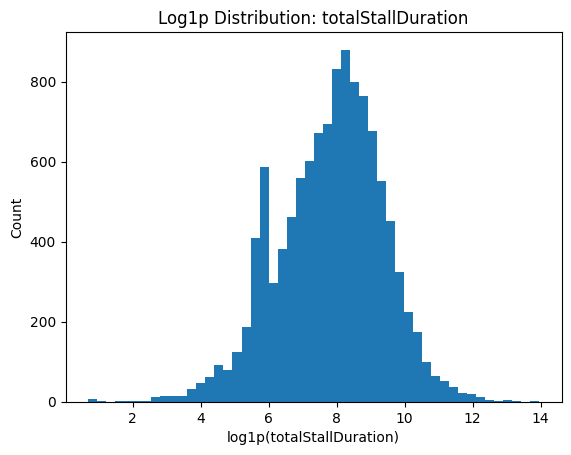

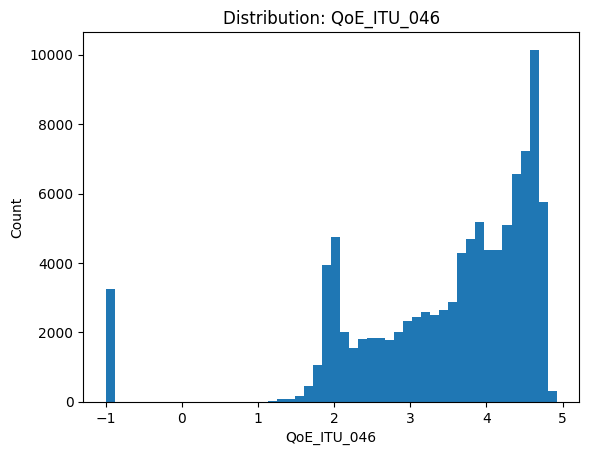

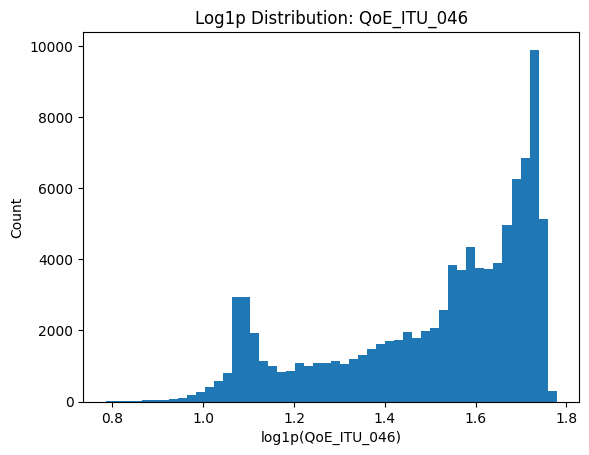

All histograms saved in: /content/drive/MyDrive/ML Project data/plots


In [ ]:
# folder to save plots
SAVE_DIR = "/content/drive/MyDrive/ML Project data/plots"
os.makedirs(SAVE_DIR, exist_ok=True)

targets_num = [t for t in targets if pd.api.types.is_numeric_dtype(df_s[t])]
for t in targets_num:
    vals = df_s[t].dropna().values

    # Normal histogram
    plt.figure()
    plt.hist(vals, bins=50)
    plt.title(f"Distribution: {t}")
    plt.xlabel(t); plt.ylabel("Count")
    fname = f"hist_{t}.png"
    plt.savefig(os.path.join(SAVE_DIR, fname))
    plt.show()

    # Log-scale histogram (only if >0 values exist)
    if (vals > 0).sum() > 0:
        plt.figure()
        plt.hist(np.log1p(vals[vals > 0]), bins=50)
        plt.title(f"Log1p Distribution: {t}")
        plt.xlabel(f"log1p({t})"); plt.ylabel("Count")
        fname = f"loghist_{t}.png"
        plt.savefig(os.path.join(SAVE_DIR, fname))
        plt.show()

print("All histograms saved in:", SAVE_DIR)


In these preliminary graphs, we can see that there in fact several data that looks to act differently in some cases (stall number, join time etc...) this is what we are going to try to study.

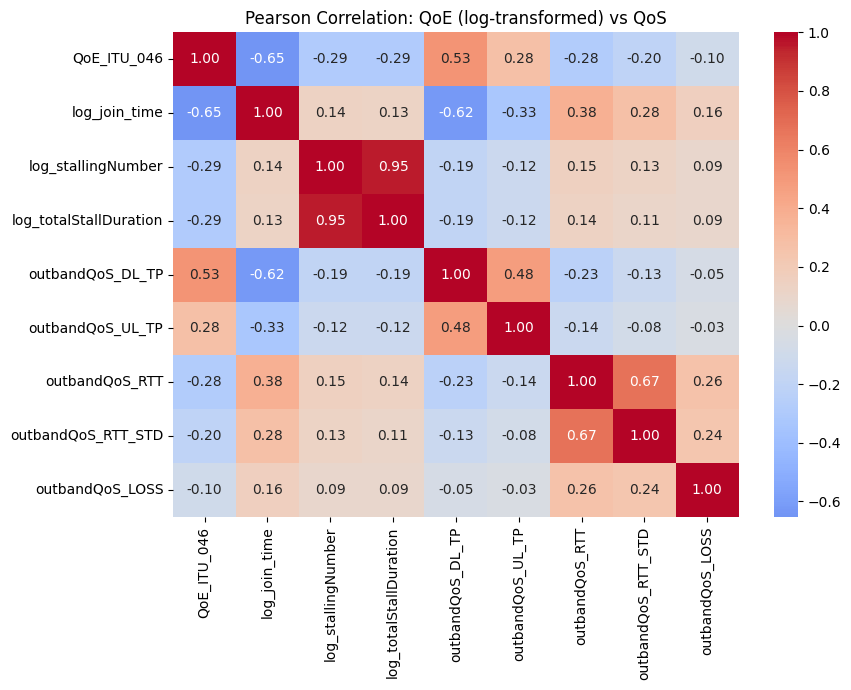

In [ ]:
SAVE_DIR = "/content/drive/MyDrive/ML Project data/plots"
os.makedirs(SAVE_DIR, exist_ok=True)

# QoE targets
targets_raw = ["QoE_ITU_046", "join_time", "stallingNumber", "totalStallDuration"]
targets_present = [t for t in targets_raw if t in df_s.columns]

# Apply log1p to skewed QoE metrics
df_corr = df_s.copy()
log_targets = ["join_time", "stallingNumber", "totalStallDuration"]
for col in log_targets:
    if col in df_corr.columns:
        df_corr[f"log_{col}"] = np.log1p(df_corr[col])

# Keep MOS as raw, use log versions for others
targets_final = ["QoE_ITU_046"] + [f"log_{c}" for c in log_targets if f"log_{c}" in df_corr.columns]

# QoS drivers
qos_candidates = [
    "outbandQoS_DL_TP", "outbandQoS_UL_TP",
    "outbandQoS_RTT", "outbandQoS_RTT_STD", "outbandQoS_LOSS"
]
qos_present = [c for c in qos_candidates if c in df_corr.columns]

# Final features for correlation
corr_cols = targets_final + qos_present

# Pearson correlation
corr_pearson = df_corr[corr_cols].corr(method="pearson", numeric_only=True)

plt.figure(figsize=(9,7))
sns.heatmap(corr_pearson, annot=True, cmap="coolwarm", center=0, fmt=".2f")
plt.title("Pearson Correlation: QoE (log-transformed) vs QoS")
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, "correlation_qoe_qos_log_pearson.png"))
plt.show()



First we build a basic Correlation matrix to try to see if there are data that may have a direct influence, and that is not intuitive

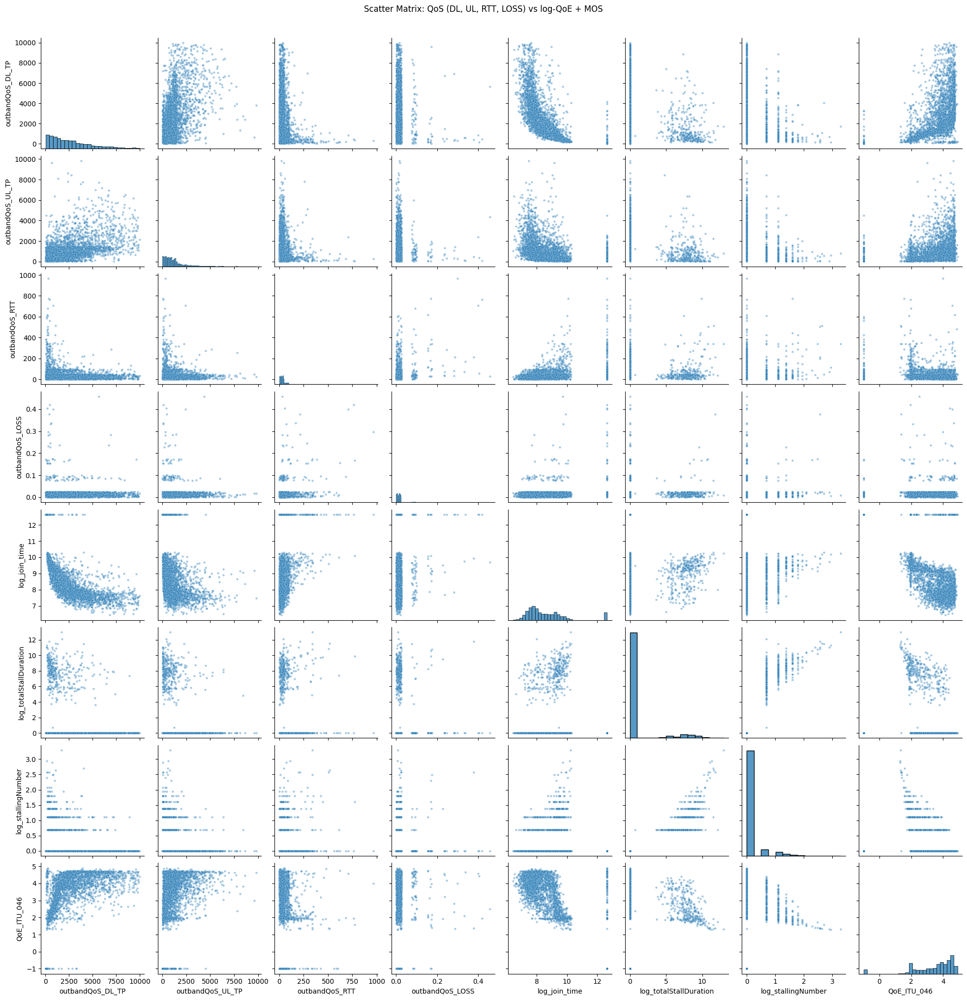

In [ ]:
# QoS features (raw, now including UL throughput)
qos_feats = ["outbandQoS_DL_TP", "outbandQoS_UL_TP", "outbandQoS_RTT", "outbandQoS_LOSS"]
qos_feats = [f for f in qos_feats if f in df_s.columns]

# QoE targets to log-transform
qoe_targets = ["join_time", "totalStallDuration", "stallingNumber"]
log_feats = []

df_pair = df_s[qos_feats].copy()

for col in qoe_targets:
    if col in df_s.columns:
        new_col = f"log_{col}"
        df_pair[new_col] = np.log1p(df_s[col])
        log_feats.append(new_col)

# Add MOS (raw, already bounded)
if "QoE_ITU_046" in df_s.columns:
    df_pair["QoE_ITU_046"] = df_s["QoE_ITU_046"]

# Final feature list
features = qos_feats + log_feats + (["QoE_ITU_046"] if "QoE_ITU_046" in df_s.columns else [])

# Subsample for speed
df_pair_sample = df_pair.sample(n=min(3000, len(df_pair)), random_state=42)

# Scatter matrix / pairplot
sns.pairplot(
    df_pair_sample[features],
    diag_kind="hist",
    plot_kws=dict(s=10, alpha=0.4)
)

plt.suptitle("Scatter Matrix: QoS (DL, UL, RTT, LOSS) vs log-QoE + MOS", y=1.02)
plt.savefig(os.path.join(SAVE_DIR, "scatter_matrix_qos_logqoe_mos.png"))
plt.show()

Drawing lots of plots to see the correlation between features more clearly

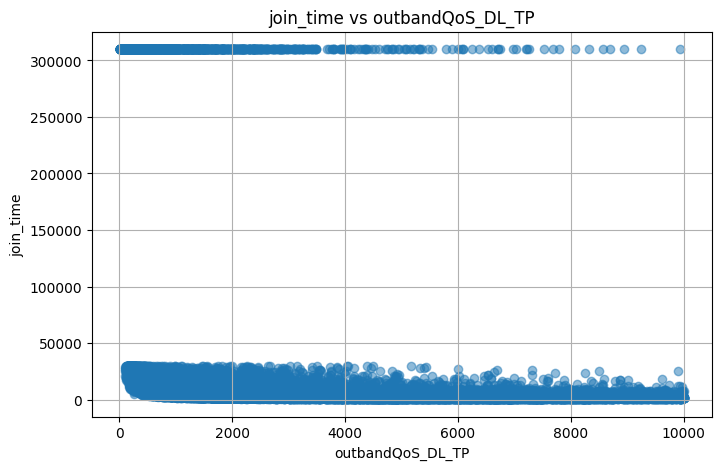

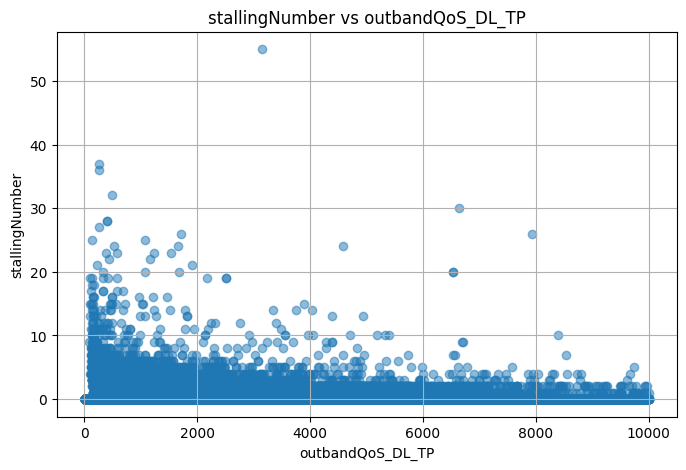

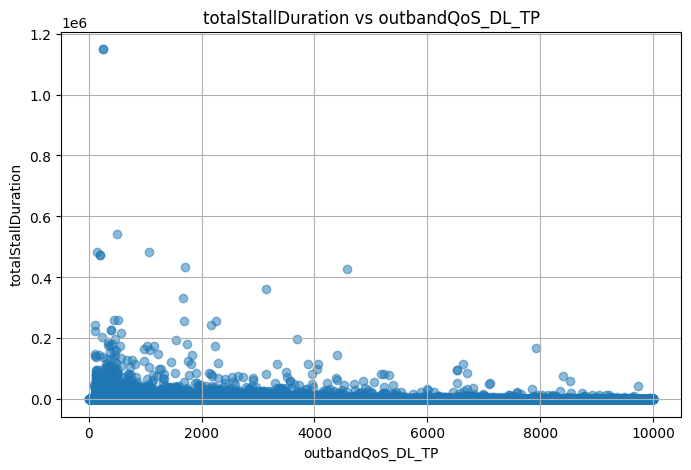

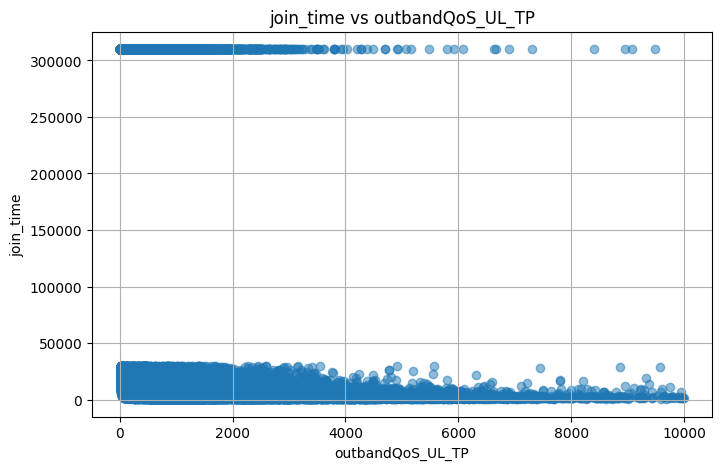

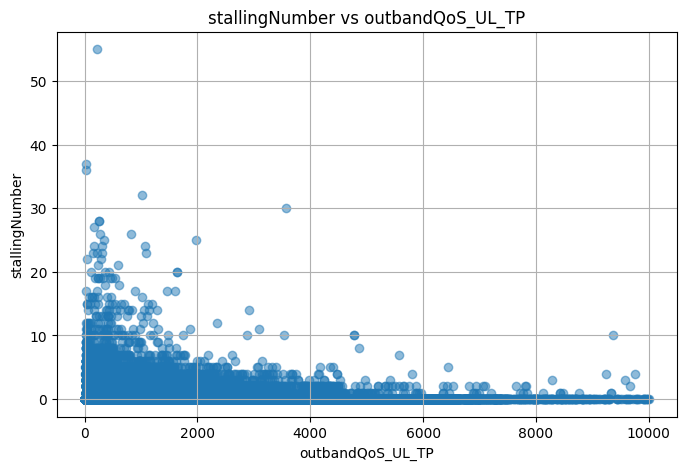

...

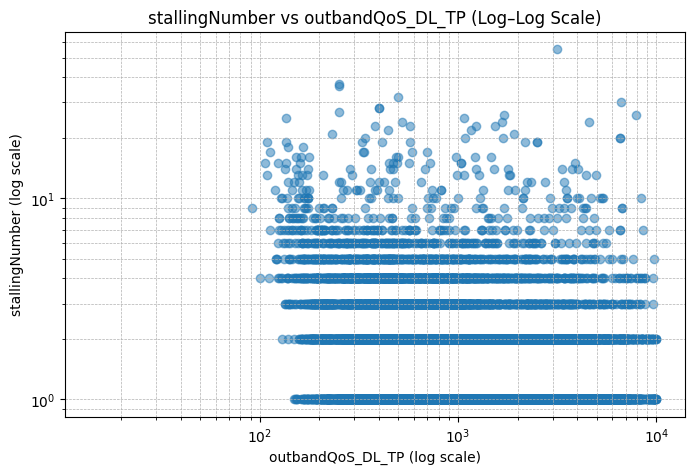

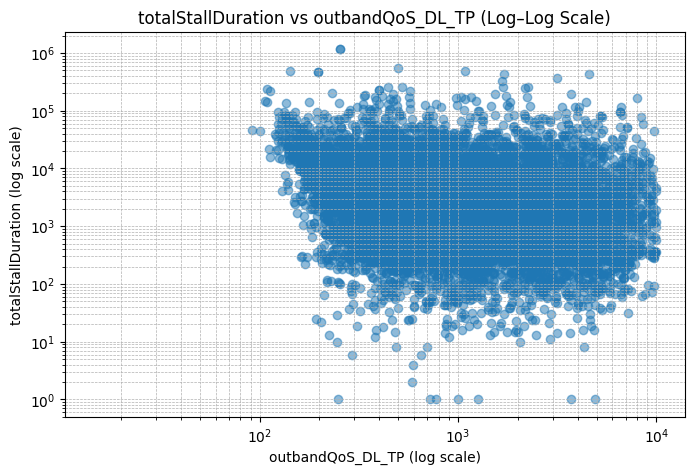

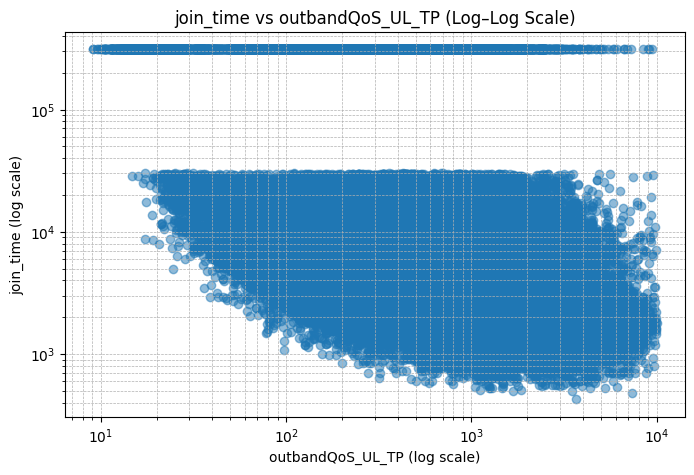

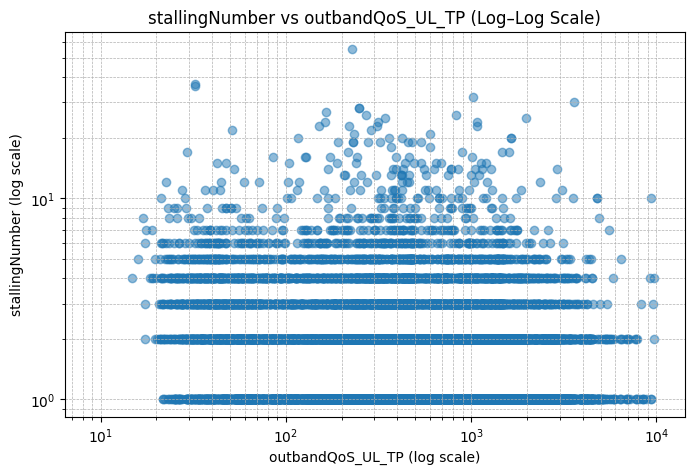

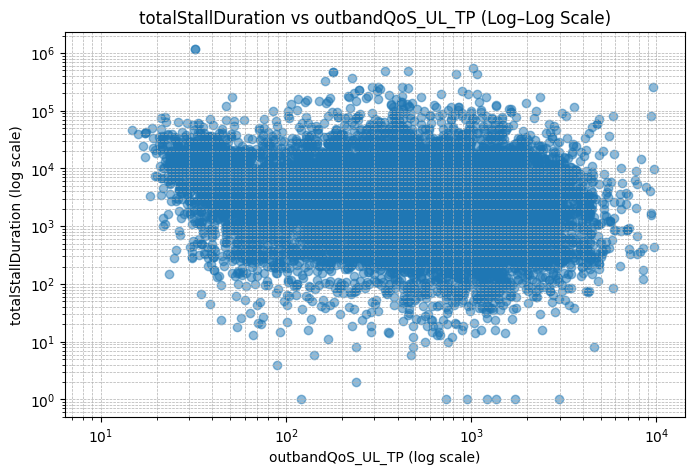

In [ ]:
import matplotlib.pyplot as plt

bitrate_cols = ["join_time", "stallingNumber", "totalStallDuration"]
qos_cols = ["outbandQoS_DL_TP", "outbandQoS_UL_TP"]

for qos_col in qos_cols:
    for bitrate in bitrate_cols:
        plt.figure(figsize=(8, 5))
        plt.scatter(df[qos_col], df[bitrate], alpha=0.5)
        plt.title(f"{bitrate} vs {qos_col}")
        plt.xlabel(qos_col)
        plt.ylabel(bitrate)
        plt.grid(True)
        plt.show()
for qos_col in qos_cols:
    for bitrate in bitrate_cols:
        plt.figure(figsize=(8, 5))
        plt.scatter(df[qos_col], df[bitrate], alpha=0.5)
        plt.xscale('log')
        plt.yscale('log')
        plt.title(f"{bitrate} vs {qos_col} (Log–Log Scale)")
        plt.xlabel(f"{qos_col} (log scale)")
        plt.ylabel(f"{bitrate} (log scale)")
        plt.grid(True, which="both", ls="--", lw=0.5)
        plt.show()






Analysing more data


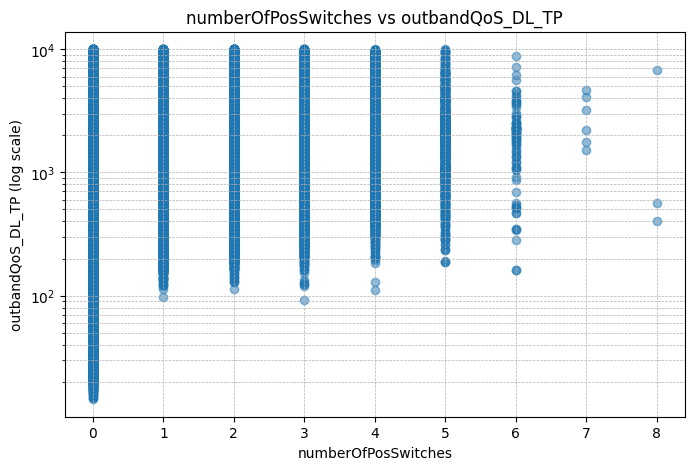

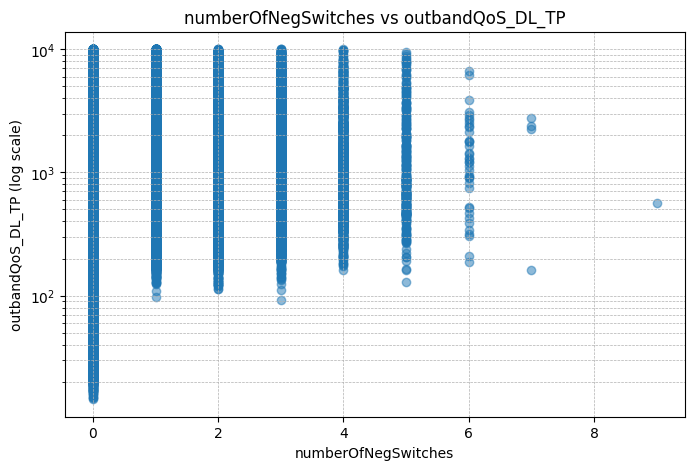

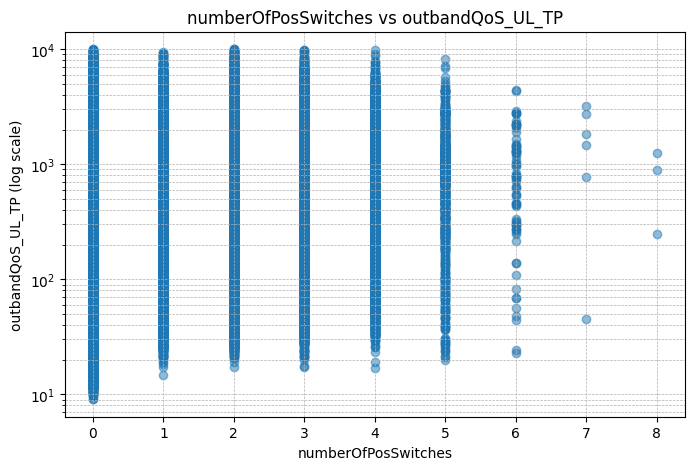

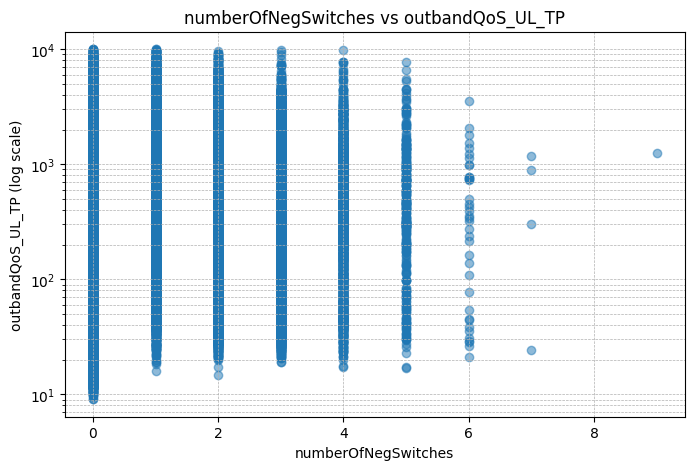

In [ ]:
import matplotlib.pyplot as plt

switch_cols = ["numberOfPosSwitches", "numberOfNegSwitches"]
qos_cols = ["outbandQoS_DL_TP", "outbandQoS_UL_TP"]

for qos_col in qos_cols:
    for switch in switch_cols:
        plt.figure(figsize=(8,5))
        plt.scatter(df[switch], df[qos_col], alpha=0.5)
        plt.yscale('log')  # Log-scale the QoS axis
        plt.title(f"{switch} vs {qos_col}")
        plt.xlabel(switch)
        plt.ylabel(f"{qos_col} (log scale)")
        plt.grid(True, which="both", ls="--", lw=0.5)
        plt.show()





Trying to figure why some features don't have a high correlation.

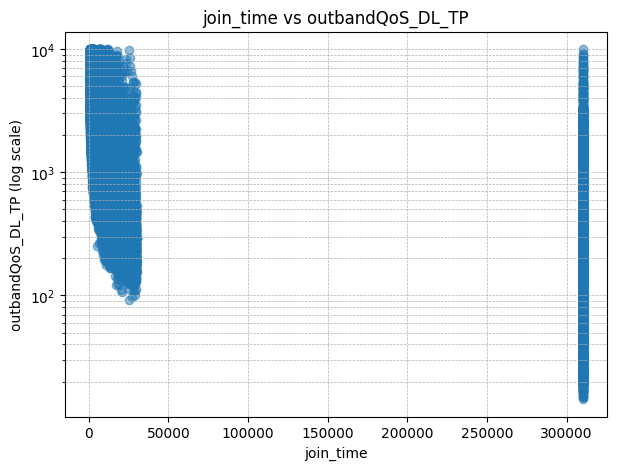

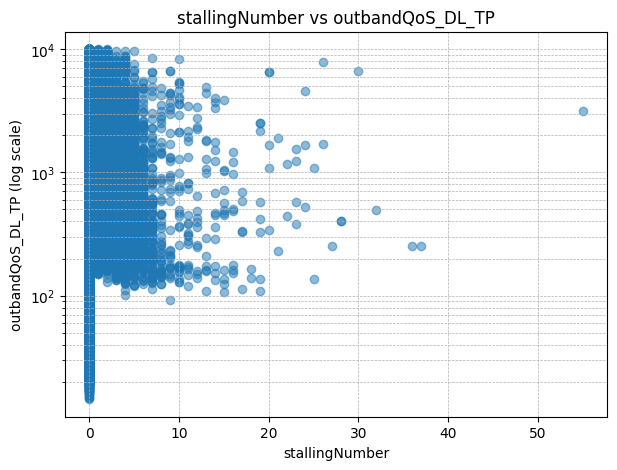

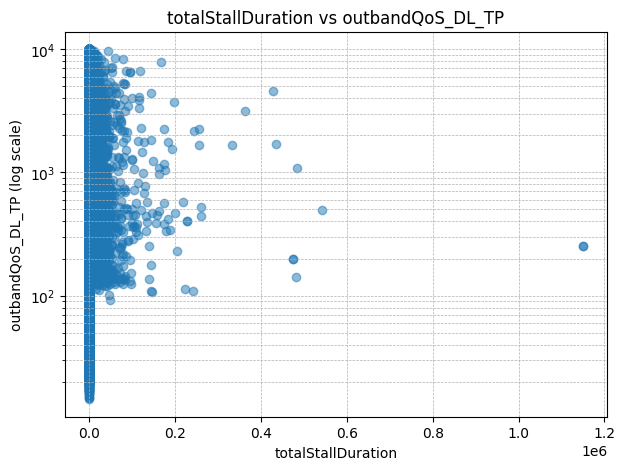

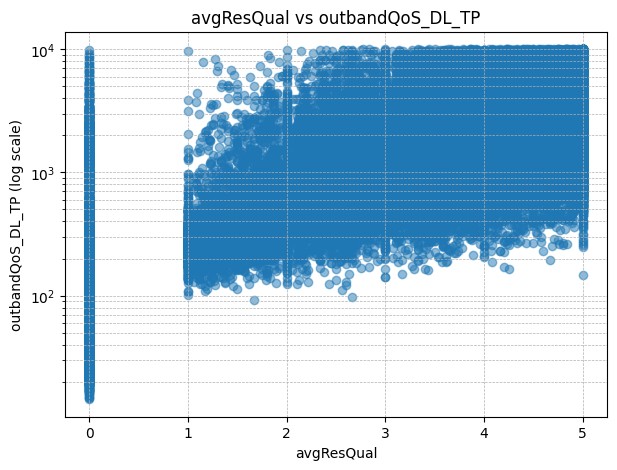

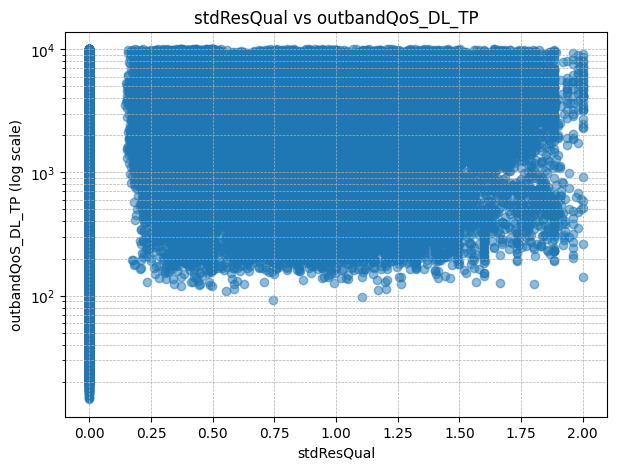

...

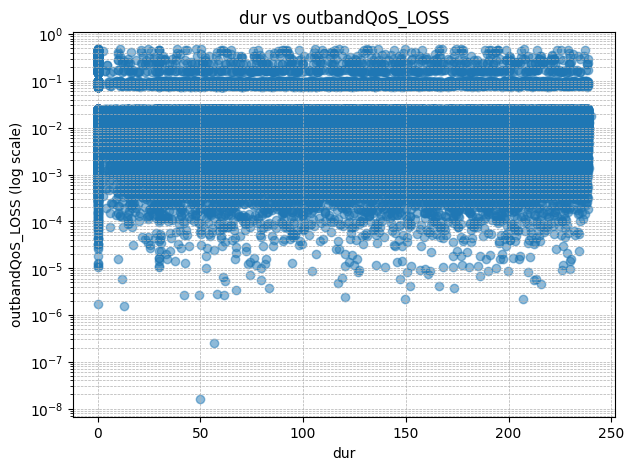

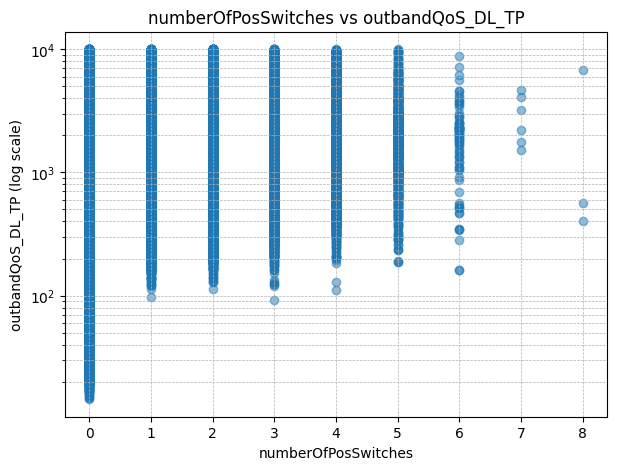

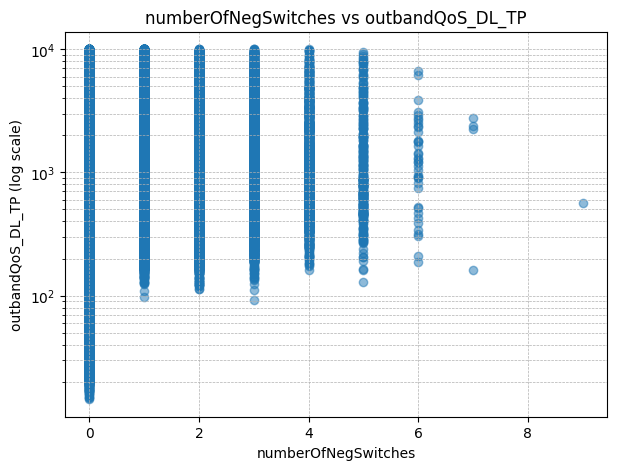

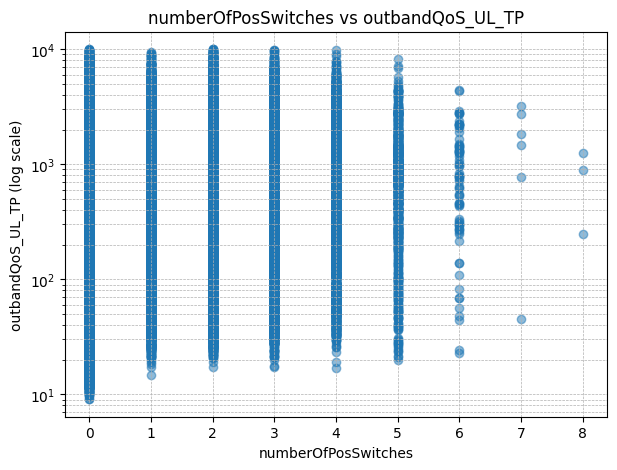

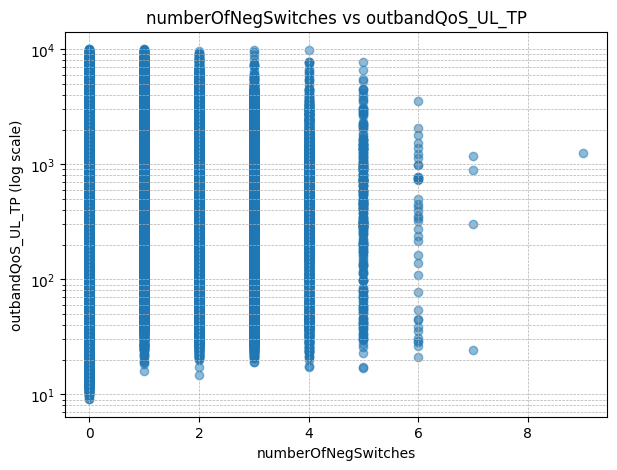

/tmp/ipython-input-1453052515.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_switches = df.groupby('QoS_DL_bin')[switch_cols].mean()


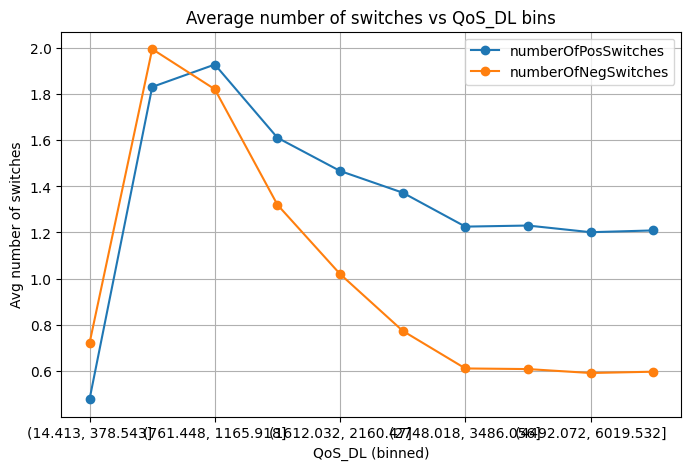

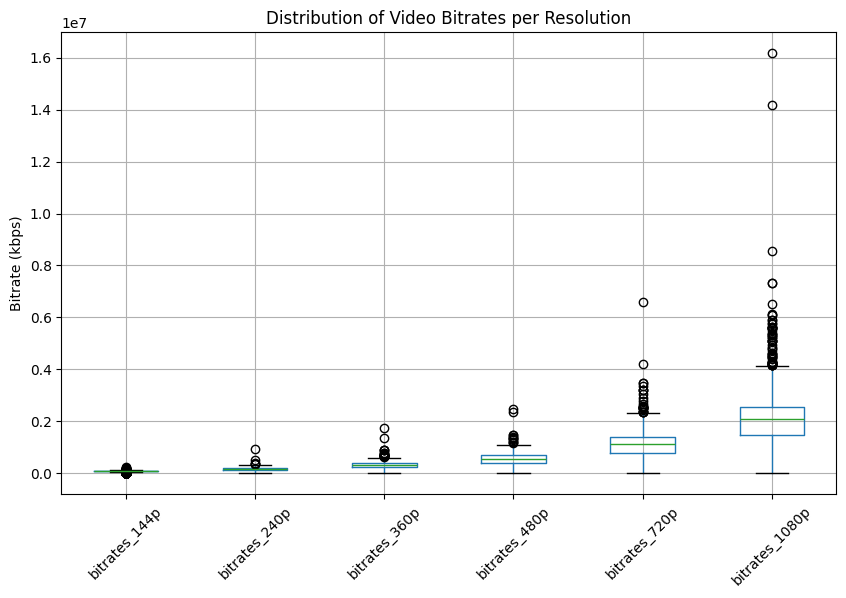

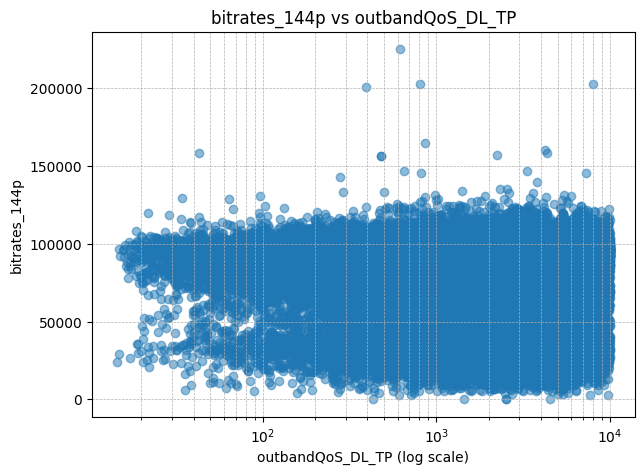

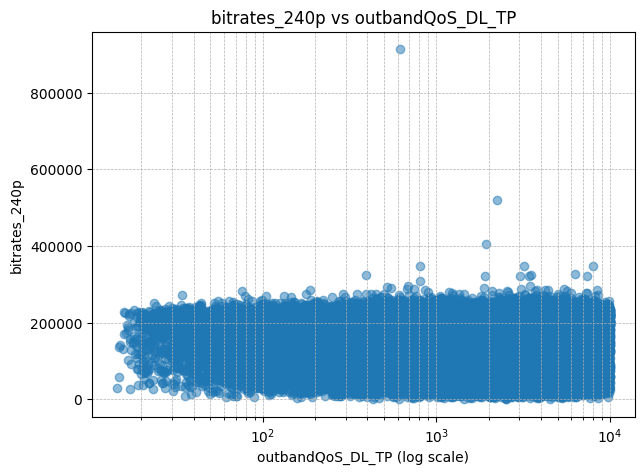

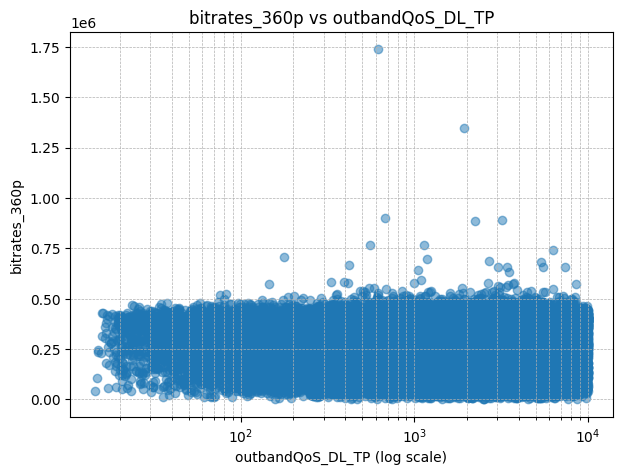

...

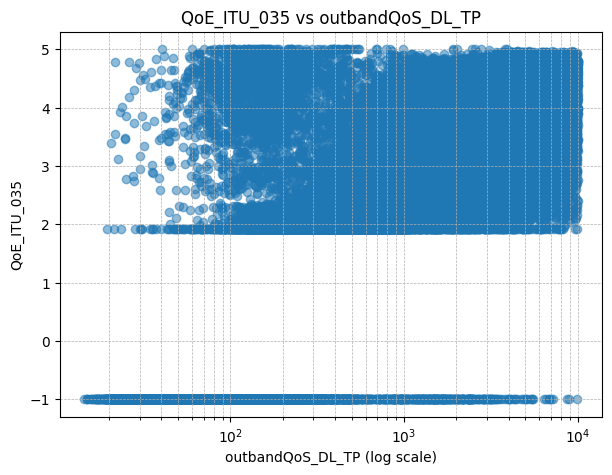

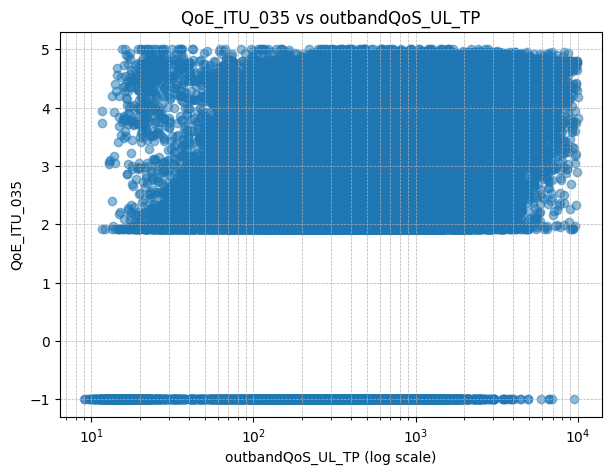

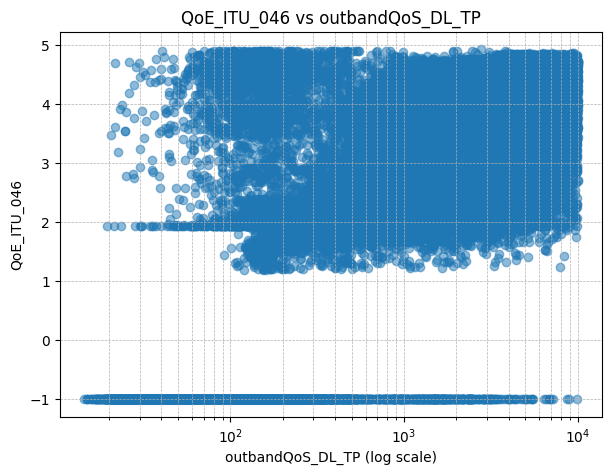

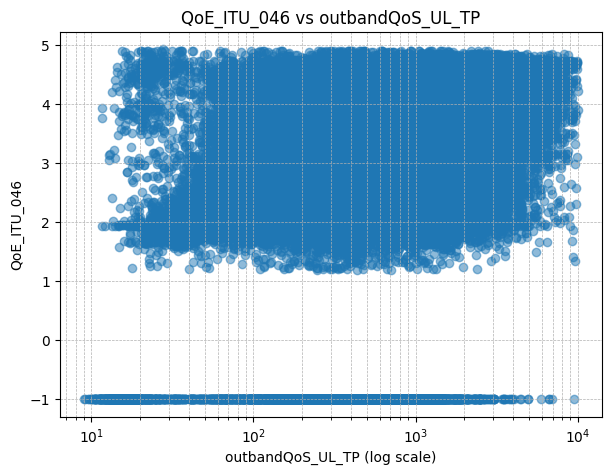

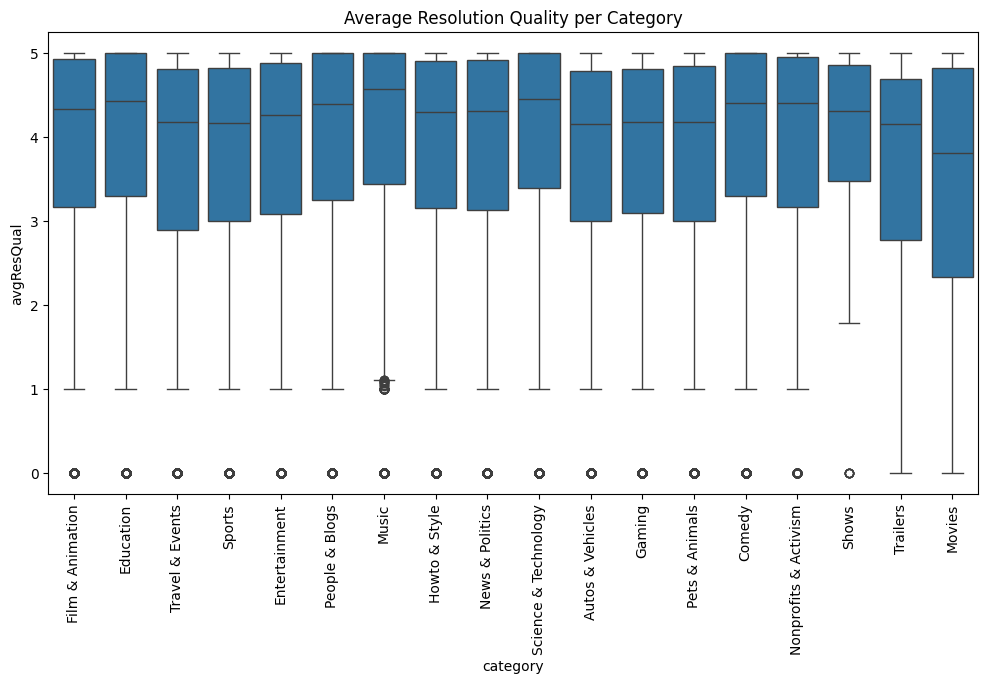

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ----------------------------
# Configuration
# ----------------------------
qos_cols = ["outbandQoS_DL_TP", "outbandQoS_UL_TP", "outbandQoS_RTT", "outbandQoS_LOSS"]
playback_kpis = ["join_time", "stallingNumber", "totalStallDuration",
                 "avgResQual", "stdResQual", "maxResQual",
                 "numberOfPosSwitches", "numberOfNegSwitches", "totalSwitches", "dur"]
switch_cols = ["numberOfPosSwitches", "numberOfNegSwitches"]
bitrate_cols = ["bitrates_144p", "bitrates_240p", "bitrates_360p",
                "bitrates_480p", "bitrates_720p", "bitrates_1080p"]
qoe_cols = ["QoE_JT", "QoE_noStall", "QoE_noSwitches", "QoE_Linear",
            "QoE_Linear2", "QoE_Linear3", "QoE_LD_SD_HD",
            "QoE_ITU_023", "QoE_ITU_035", "QoE_ITU_046"]
temporal_cols = [f"pcapStats_temporal_DLTP_t{i}" for i in range(1,101)]
first30_cols = [f"pcapStats_first30sec_DLTP_t{i}" for i in range(1,31)]

# ----------------------------
# 1. QoS vs Playback KPIs
# ----------------------------
for qos in qos_cols:
    for kpi in playback_kpis:
        plt.figure(figsize=(7,5))
        plt.scatter(df[kpi], df[qos], alpha=0.5)
        plt.yscale('log')  # QoS on log scale
        plt.xlabel(kpi)
        plt.ylabel(qos + " (log scale)")
        plt.title(f"{kpi} vs {qos}")
        plt.grid(True, which="both", ls="--", lw=0.5)
        plt.show()

# ----------------------------
# 2. Resolution Switching Trends
# ----------------------------
for qos in ["outbandQoS_DL_TP", "outbandQoS_UL_TP"]:
    for switch in switch_cols:
        plt.figure(figsize=(7,5))
        plt.scatter(df[switch], df[qos], alpha=0.5)
        plt.yscale('log')
        plt.xlabel(switch)
        plt.ylabel(qos + " (log scale)")
        plt.title(f"{switch} vs {qos}")
        plt.grid(True, which="both", ls="--", lw=0.5)
        plt.show()

# Optional: Average per QoS bin
df['QoS_DL_bin'] = pd.qcut(df['outbandQoS_DL_TP'], q=10)
mean_switches = df.groupby('QoS_DL_bin')[switch_cols].mean()
mean_switches.plot(figsize=(8,5), marker='o')
plt.title("Average number of switches vs QoS_DL bins")
plt.ylabel("Avg number of switches")
plt.xlabel("QoS_DL (binned)")
plt.grid(True)
plt.show()

# ----------------------------
# 3. Bitrate Analysis
# ----------------------------
plt.figure(figsize=(10,6))
df[bitrate_cols].boxplot()
plt.title("Distribution of Video Bitrates per Resolution")
plt.ylabel("Bitrate (kbps)")
plt.xticks(rotation=45)
plt.show()

# Scatter: QoS vs achieved bitrate
for qos in ["outbandQoS_DL_TP", "outbandQoS_UL_TP"]:
    for br in bitrate_cols:
        plt.figure(figsize=(7,5))
        plt.scatter(df[qos], df[br], alpha=0.5)
        plt.xscale('log')
        plt.xlabel(qos + " (log scale)")
        plt.ylabel(br)
        plt.title(f"{br} vs {qos}")
        plt.grid(True, which="both", ls="--", lw=0.5)
        plt.show()

# ----------------------------
# 4. Chunk Size & Duration Analysis
# ----------------------------
chunk_size_cols = [col for col in df.columns if "videoChunkSizesHTTP" in col or "audioChunkSizesHTTP" in col]
chunk_dur_cols  = [col for col in df.columns if "videoChunkDursHTTP" in col or "audioChunkDursHTTP" in col]

for col_group, title in zip([chunk_size_cols, chunk_dur_cols], ["Chunk Sizes", "Chunk Durations"]):
    plt.figure(figsize=(10,6))
    df[col_group].boxplot()
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()

# ----------------------------
# 5. Temporal Throughput Analysis
# ----------------------------
temporal_mean = df[temporal_cols].mean(axis=0)  # mean over all videos, per segment
temporal_std  = df[temporal_cols].std(axis=0)   # std over all videos, per segment

plt.figure(figsize=(12,6))
plt.plot(range(len(temporal_cols)), temporal_mean, label="Average Temporal DL TP")
plt.fill_between(range(len(temporal_cols)),
                 temporal_mean - temporal_std,
                 temporal_mean + temporal_std,
                 alpha=0.2)
plt.title("Average DL Throughput over Time (Temporal)")
plt.xlabel("Time Segment")
plt.ylabel("DL Throughput")
plt.grid(True)
plt.show()

# ----------------------------
# 6. QoE Metrics
# ----------------------------
plt.figure(figsize=(10,6))
df[qoe_cols].boxplot()
plt.title("Distribution of QoE Metrics")
plt.xticks(rotation=45)
plt.show()

# Scatter: QoE vs QoS
for qoe in qoe_cols:
    for qos in ["outbandQoS_DL_TP", "outbandQoS_UL_TP"]:
        plt.figure(figsize=(7,5))
        plt.scatter(df[qos], df[qoe], alpha=0.5)
        plt.xscale('log')
        plt.xlabel(qos + " (log scale)")
        plt.ylabel(qoe)
        plt.title(f"{qoe} vs {qos}")
        plt.grid(True, which="both", ls="--", lw=0.5)
        plt.show()

# ----------------------------
# 7. Category Analysis
# ----------------------------
plt.figure(figsize=(12,6))
sns.boxplot(x="category", y="avgResQual", data=df)
plt.xticks(rotation=90)
plt.title("Average Resolution Quality per Category")
plt.show()


Plotting some graphs to analyse data, trying to figure out if something stands out.


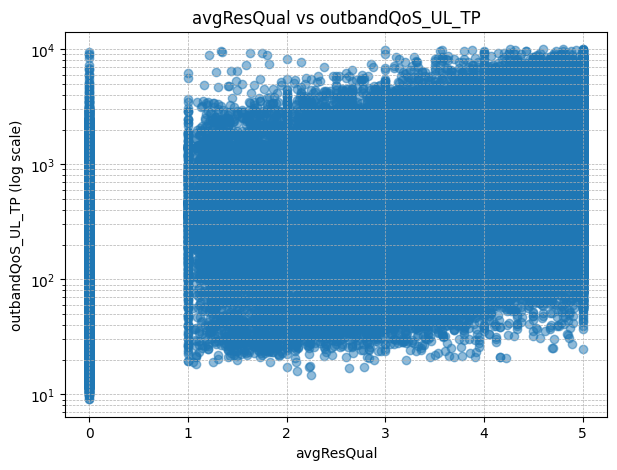

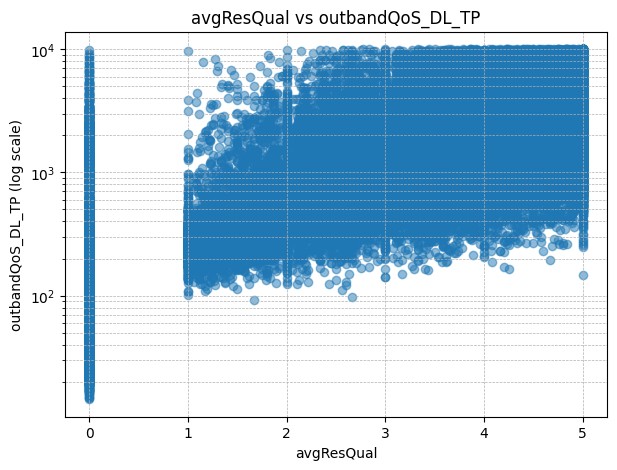

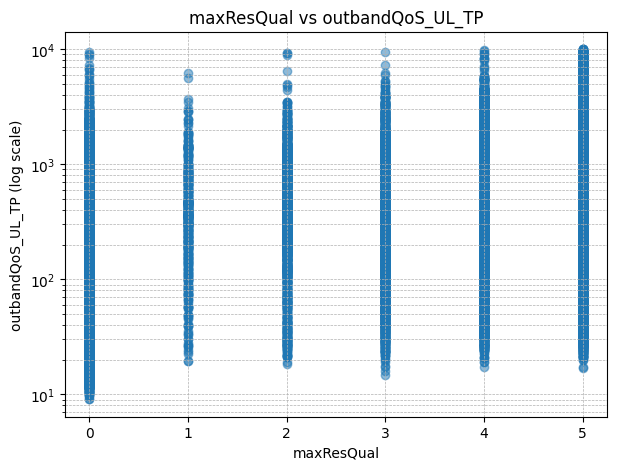

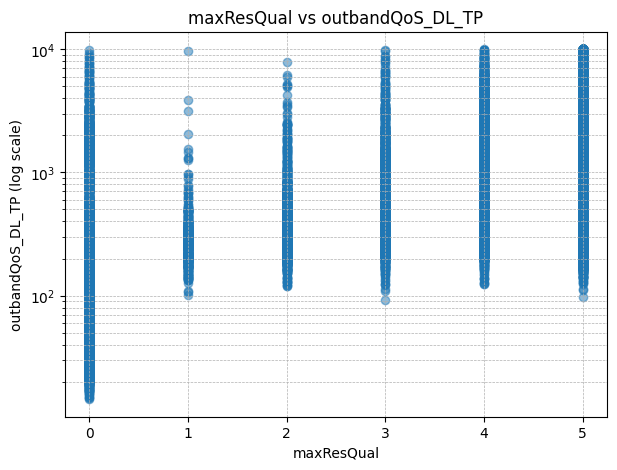

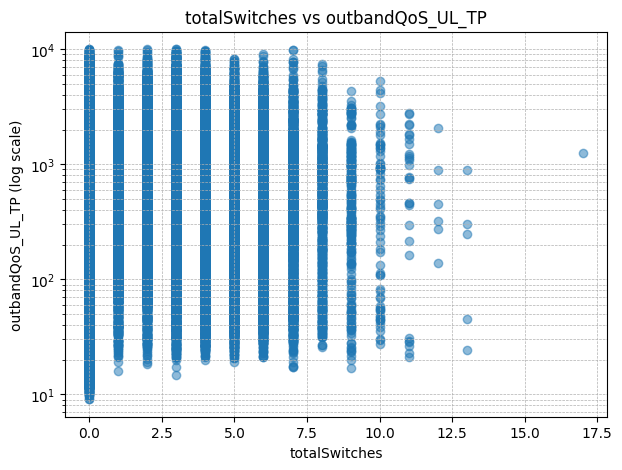

...

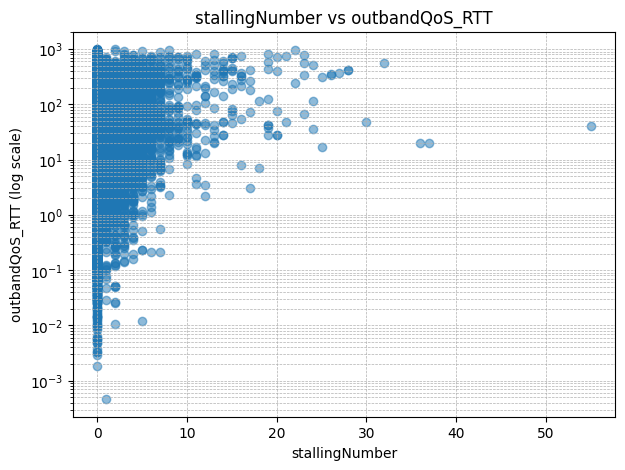

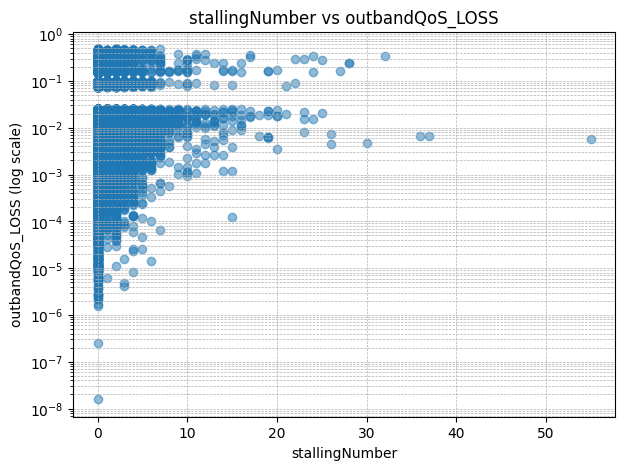

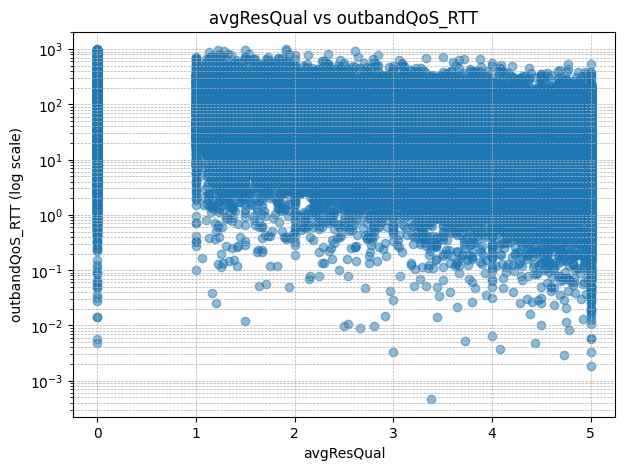

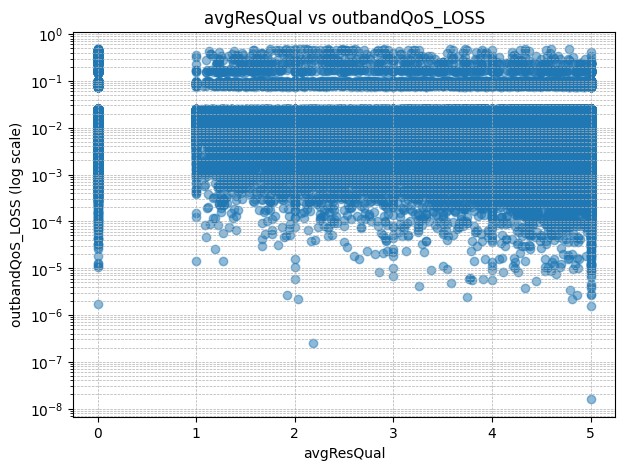

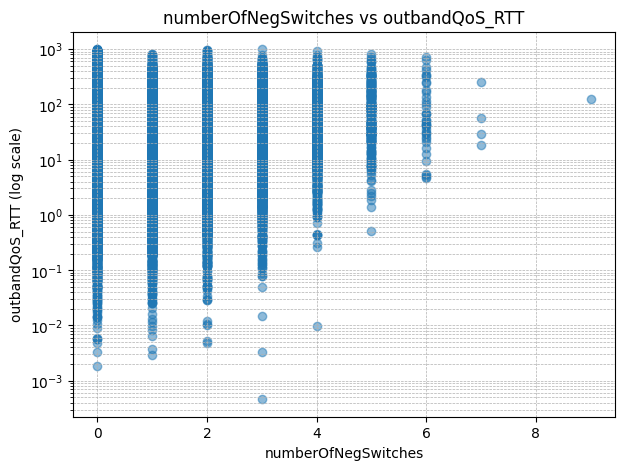

/tmp/ipython-input-4046674632.py:75: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_switches = df.groupby('RTT_bin')["totalSwitches"].mean()


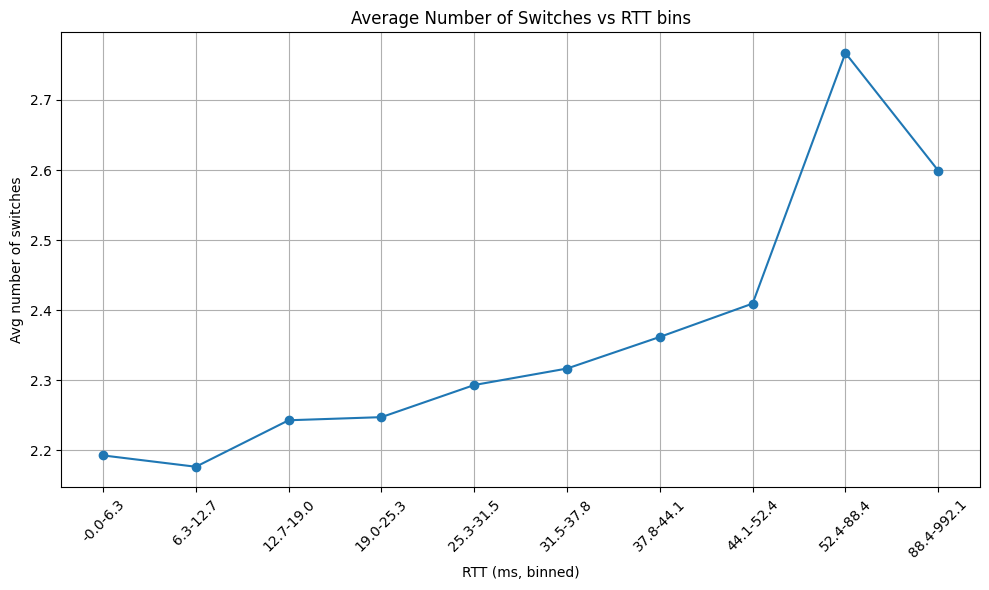

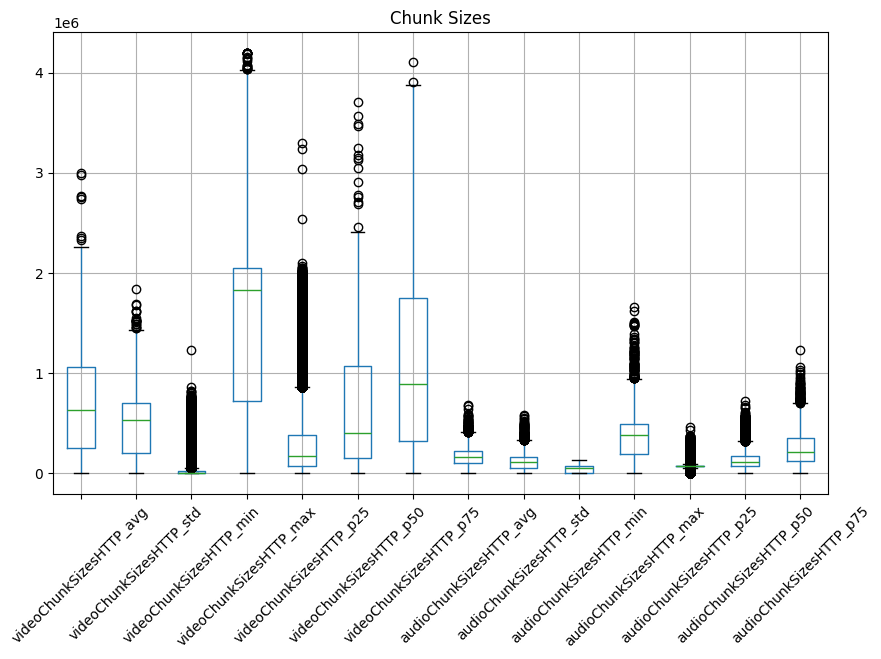

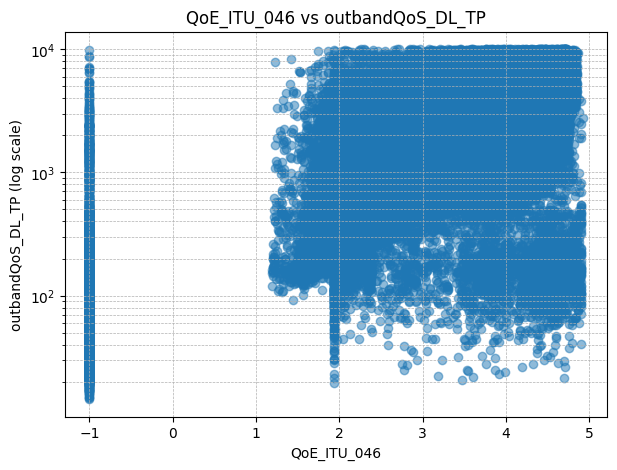

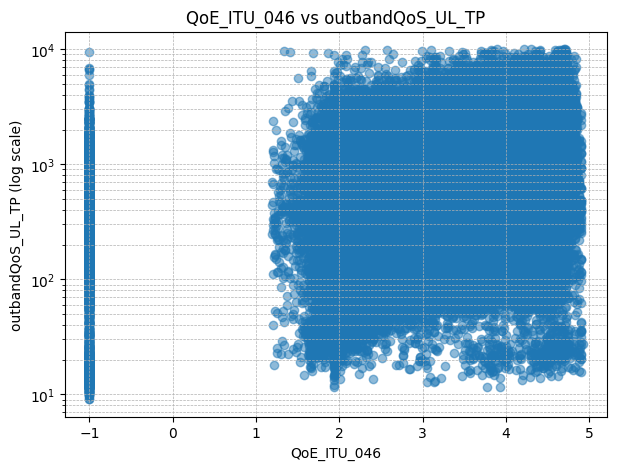

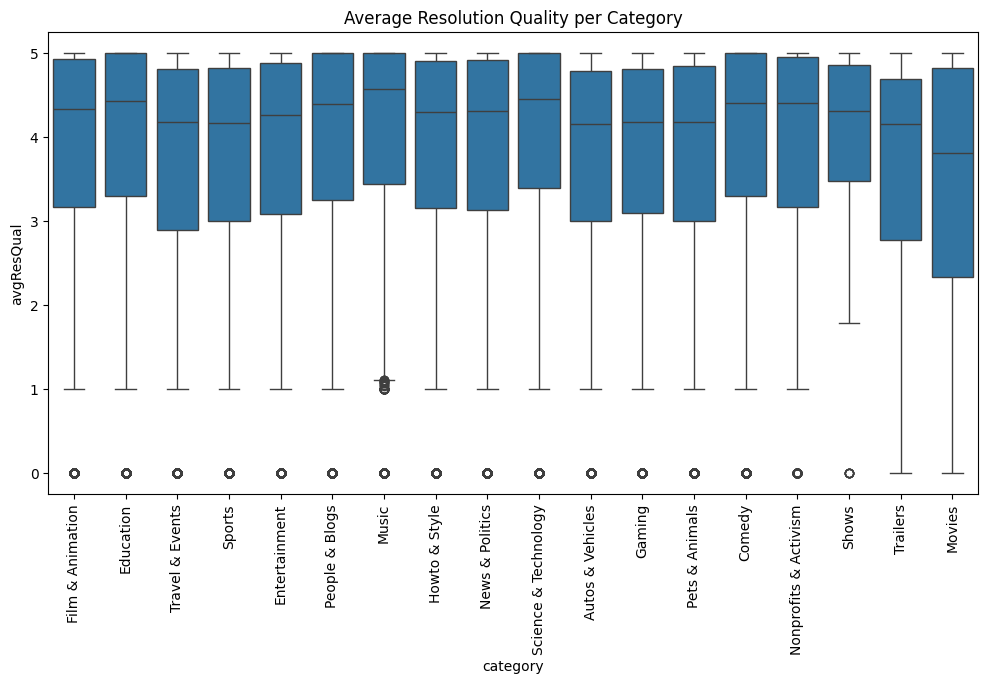

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Avg Res Quality vs UL & DL
for qos in ["outbandQoS_UL_TP", "outbandQoS_DL_TP"]:
    plt.figure(figsize=(7,5))
    plt.scatter(df["avgResQual"], df[qos], alpha=0.5)
    plt.yscale('log')
    plt.xlabel("avgResQual")
    plt.ylabel(qos + " (log scale)")
    plt.title(f"avgResQual vs {qos}")
    plt.grid(True, which="both", ls="--", lw=0.5)
    plt.show()

# 2. Max Res Quality vs UL & DL
for qos in ["outbandQoS_UL_TP", "outbandQoS_DL_TP"]:
    plt.figure(figsize=(7,5))
    plt.scatter(df["maxResQual"], df[qos], alpha=0.5)
    plt.yscale('log')
    plt.xlabel("maxResQual")
    plt.ylabel(qos + " (log scale)")
    plt.title(f"maxResQual vs {qos}")
    plt.grid(True, which="both", ls="--", lw=0.5)
    plt.show()

# 3. Number of switches vs UL & DL
for qos in ["outbandQoS_UL_TP", "outbandQoS_DL_TP"]:
    plt.figure(figsize=(7,5))
    plt.scatter(df["totalSwitches"], df[qos], alpha=0.5)
    plt.yscale('log')
    plt.xlabel("totalSwitches")
    plt.ylabel(qos + " (log scale)")
    plt.title(f"totalSwitches vs {qos}")
    plt.grid(True, which="both", ls="--", lw=0.5)
    plt.show()

# 4. Stalling number vs RTT & LOSS
for qos in ["outbandQoS_RTT", "outbandQoS_LOSS"]:
    plt.figure(figsize=(7,5))
    plt.scatter(df["stallingNumber"], df[qos], alpha=0.5)
    plt.yscale('log')
    plt.xlabel("stallingNumber")
    plt.ylabel(qos + " (log scale)")
    plt.title(f"stallingNumber vs {qos}")
    plt.grid(True, which="both", ls="--", lw=0.5)
    plt.show()

# 5. Avg Res Quality vs RTT & LOSS
for qos in ["outbandQoS_RTT", "outbandQoS_LOSS"]:
    plt.figure(figsize=(7,5))
    plt.scatter(df["avgResQual"], df[qos], alpha=0.5)
    plt.yscale('log')
    plt.xlabel("avgResQual")
    plt.ylabel(qos + " (log scale)")
    plt.title(f"avgResQual vs {qos}")
    plt.grid(True, which="both", ls="--", lw=0.5)
    plt.show()

# 6. Nb of negative switches vs RTT
plt.figure(figsize=(7,5))
plt.scatter(df["numberOfNegSwitches"], df["outbandQoS_RTT"], alpha=0.5)
plt.yscale('log')
plt.xlabel("numberOfNegSwitches")
plt.ylabel("outbandQoS_RTT (log scale)")
plt.title("numberOfNegSwitches vs outbandQoS_RTT")
plt.grid(True, which="both", ls="--", lw=0.5)
plt.show()

# 7. Avg Number of switches vs RTT (binned)
# Create RTT bins
df['RTT_bin'] = pd.qcut(df['outbandQoS_RTT'], q=10)

# Compute mean switches per bin
mean_switches = df.groupby('RTT_bin')["totalSwitches"].mean()

# Convert IntervalIndex to readable labels (e.g. "0–12", "12–18", ...)
bin_labels = [f"{interval.left:.1f}-{interval.right:.1f}" for interval in mean_switches.index]

# Plot
plt.figure(figsize=(10,6))
plt.plot(bin_labels, mean_switches, marker='o')
plt.title("Average Number of Switches vs RTT bins")
plt.ylabel("Avg number of switches")
plt.xlabel("RTT (ms, binned)")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


# 8. Chunk sizes (box plot)
chunk_size_cols = [col for col in df.columns if "videoChunkSizesHTTP" in col or "audioChunkSizesHTTP" in col]
plt.figure(figsize=(10,6))
df[chunk_size_cols].boxplot()
plt.title("Chunk Sizes")
plt.xticks(rotation=45)
plt.show()

# 9. QoE vs Outband DL & UL
for qos in ["outbandQoS_DL_TP", "outbandQoS_UL_TP"]:
    plt.figure(figsize=(7,5))
    plt.scatter(df["QoE_ITU_046"], df[qos], alpha=0.5)
    plt.yscale('log')
    plt.xlabel("QoE_ITU_046")
    plt.ylabel(qos + " (log scale)")
    plt.title(f"QoE_ITU_046 vs {qos}")
    plt.grid(True, which="both", ls="--", lw=0.5)
    plt.show()

# 10. Avg Quality vs category
plt.figure(figsize=(12,6))
sns.boxplot(x="category", y="avgResQual", data=df)
plt.xticks(rotation=90)
plt.title("Average Resolution Quality per Category")
plt.show()


Let's try to classify Stalls

In [ ]:
from sklearn.model_selection import train_test_split
df_s["has_stall"] = (df_s["stallingNumber"] > 0).astype(int)


target = "has_stall"
feature_cols = [
    "outbandQoS_DL_TP",
    "outbandQoS_UL_TP",
    "outbandQoS_RTT",
    "outbandQoS_RTT_STD",
    "outbandQoS_LOSS",
    "pcapStats_stats_avg_DL_TP",
    "pcapStats_stats_std_DL_TP",
    "pcapStats_stats_p90_DL_TP",
    "pcapStats_stats_avg_DL_t",
    "pcapStats_stats_avg_DL_pkt",
]

print("Using features:", feature_cols)

df_model = df_s.dropna(subset=feature_cols + [target]).copy()

X = df_model[feature_cols]
y = df_model[target].astype(int)


# X = features, y = labels (has_stall)
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,       # 20% test, 80% train
    random_state=42,
    stratify=y           # keep class balance similar in both sets
)



Using features: ['outbandQoS_DL_TP', 'outbandQoS_UL_TP', 'outbandQoS_RTT', 'outbandQoS_RTT_STD', 'outbandQoS_LOSS', 'pcapStats_stats_avg_DL_TP', 'pcapStats_stats_std_DL_TP', 'pcapStats_stats_p90_DL_TP', 'pcapStats_stats_avg_DL_t', 'pcapStats_stats_avg_DL_pkt']


We'll do a binary classification: 0=No stall, and 1=stall

In [ ]:
# Predict No stall (0) or Stall (1) (Bad stall prediction)

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score

clf = RandomForestClassifier(
    n_estimators=200,
    max_depth=None,
    n_jobs=-1,
    class_weight="balanced"  # helpful if classes are imbalanced
)
clf.fit(X_train, y_train)

y_val_pred = clf.predict(X_test)
y_val_proba = clf.predict_proba(X_test)[:, 1]

print(classification_report(y_test, y_val_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_val_proba))


              precision    recall  f1-score   support

           0       0.90      0.99      0.94     17727
           1       0.62      0.15      0.24      2273

    accuracy                           0.89     20000
   macro avg       0.76      0.57      0.59     20000
weighted avg       0.87      0.89      0.86     20000

ROC-AUC: 0.813465412299675


It seems that it is not very accurate (recall = 0.14 and 63% precision), let's give it more confidence to see what happens

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import StandardScaler

# Scale features
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_val_s   = scaler.transform(X_test)

input_dim = X_train_s.shape[1]

model = keras.Sequential([
    keras.layers.Input(shape=(input_dim,)),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(32, activation="relu"),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(1, activation="sigmoid")  # binary output
])

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss="binary_crossentropy",
    metrics=[keras.metrics.AUC(name="auc"), "accuracy"]
)

history = model.fit(
    X_train_s, y_train,
    validation_data=(X_val_s, y_test),
    epochs=20,
    batch_size=256,
    class_weight={0:1.0, 1: (len(y_train)/y_train.sum())},  # give more weight to stalls
    verbose=1
)
from sklearn.metrics import classification_report, roc_auc_score

y_val_scores = model.predict(X_val_s).ravel()       # probabilities
y_val_pred   = (y_val_scores >= 0.5).astype(int)    # labels at threshold 0.5

print(classification_report(y_test, y_val_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_val_scores))



Epoch 1/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6342 - auc: 0.6977 - loss: 1.2219 - val_accuracy: 0.6690 - val_auc: 0.7998 - val_loss: 0.6412
Epoch 2/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6979 - auc: 0.7884 - loss: 1.0560 - val_accuracy: 0.7247 - val_auc: 0.8094 - val_loss: 0.5908
Epoch 3/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7255 - auc: 0.7980 - loss: 1.0288 - val_accuracy: 0.7208 - val_auc: 0.8123 - val_loss: 0.5986
Epoch 4/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7224 - auc: 0.8050 - loss: 1.0159 - val_accuracy: 0.7245 - val_auc: 0.8135 - val_loss: 0.5940
Epoch 5/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7337 - auc: 0.8060 - loss: 1.0038 - val_accuracy: 0.7459 - val_auc: 0.8146 - val_loss: 0.5617
Epoch 6/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7403 - auc: 0.8058 - loss: 1.0059 - val_accuracy: 0.7523 - val_auc: 0.8157 - val_loss: 0.5456
Epoch 7/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 

here is a bit better, yet it still doesn't have a lot of precision (28%) but every time it's stalls it detects it! so a lot of false positives.

In [ ]:
df_reg = df_s.dropna(subset=feature_cols + ["join_time", "totalStallDuration"]).copy()

X = df_reg[feature_cols]
y = np.log1p(df_reg["totalStallDuration"])   # or "join_time"

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

reg = RandomForestRegressor(
    n_estimators=200,
    max_depth=None,
    n_jobs=-1,
    random_state=42
)
reg.fit(X_train, y_train)

y_pred = reg.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae  = mean_absolute_error(y_test, y_pred)
print("RMSE (log-scale):", rmse)
print("MAE  (log-scale):", mae)


y_test_sec = np.expm1(y_test)
y_pred_sec = np.expm1(y_pred)
rmse_sec = np.sqrt(mean_squared_error(y_test_sec, y_pred_sec))
mae_sec  = mean_absolute_error(y_test_sec, y_pred_sec)
print("RMSE (Milliseconds):", rmse_sec)
print("MAE  (Milliseconds):", mae_sec)


RMSE (log-scale): 2.2256833626676964
MAE  (log-scale): 1.2606616503699768
RMSE (Milliseconds): 9589.460973564303
MAE  (Milliseconds): 796.5683536534974


Let's try to make it more accurate by changing the balance and the criteria of wether or not it will stall ( for example if stall chance > 30%, consider as stall because of the rarity of stalls)

Data loaded. Total samples: 100000
Class Balance: {0: 0.88635, 1: 0.11365}

--- Training ISP-View (Network Only) ---
Using 10 features.
Best Decision Threshold: 0.215
              precision    recall  f1-score   support

           0       0.94      0.87      0.90     17727
           1       0.36      0.56      0.44      2273

    accuracy                           0.84     20000
   macro avg       0.65      0.71      0.67     20000
weighted avg       0.87      0.84      0.85     20000

ROC-AUC Score: 0.8129

--- Training Full-View (Network + Player) ---
Using 16 features.
Best Decision Threshold: 0.205
              precision    recall  f1-score   support

           0       0.95      0.86      0.90     17727
           1       0.37      0.61      0.46      2273

    accuracy                           0.84     20000
   macro avg       0.66      0.74      0.68     20000
weighted avg       0.88      0.84      0.85     20000

ROC-AUC Score: 0.8273


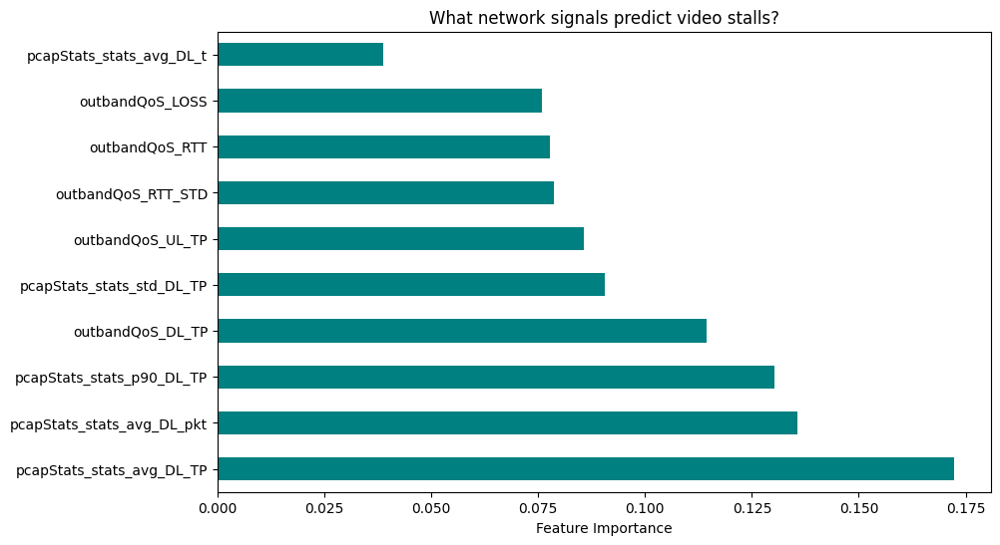

Severe Stall Count: {0: 88645, 1: 11355}


NameError: name 'XGBClassifier' is not defined

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_curve

# ==========================================
# 1. SETUP & FEATURE DEFINITION
# ==========================================

# Define the features accessible to an ISP (Encrypted traffic analysis)
features_isp = [
    "outbandQoS_DL_TP",
    "outbandQoS_UL_TP",
    "outbandQoS_RTT",
    "outbandQoS_RTT_STD",
    "outbandQoS_LOSS",
    "pcapStats_stats_avg_DL_TP",
    "pcapStats_stats_std_DL_TP",
    "pcapStats_stats_p90_DL_TP",
    "pcapStats_stats_avg_DL_t",
    "pcapStats_stats_avg_DL_pkt"
]

# Define "Cheating" features (Player internals) to compare against
# (We add these to the ISP features to see if accuracy improves)
features_player = [
    "bitrates_144p", "bitrates_240p", "bitrates_360p",
    "bitrates_480p", "bitrates_720p", "bitrates_1080p"
]

features_full = features_isp + features_player

# ==========================================
# 2. DATA PREPARATION
# ==========================================

# Create the binary target: 1 if it stalled, 0 if smooth
# (Assuming your dataframe is named 'df_s' or 'df' - using 'df_s' from your snippet)
# If you need to reload: df_s = pd.read_csv('your_file.csv')

df_clean = df_s.copy()
df_clean["has_stall"] = (df_clean["stallingNumber"] > 0).astype(int)

# Drop any rows that are missing critical data
df_clean = df_clean.dropna(subset=features_full + ["has_stall"])

print(f"Data loaded. Total samples: {len(df_clean)}")
print(f"Class Balance: {df_clean['has_stall'].value_counts(normalize=True).to_dict()}")

# Split the data
# We use 'stratify' to make sure both Train and Test have the same % of stalls
X = df_clean[features_full] # Load all features for now, we will select subsets later
y = df_clean["has_stall"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ==========================================
# 3. THE TRAINING ENGINE (Function)
# ==========================================

def train_and_evaluate(feature_list, name="Model"):
    print(f"\n--- Training {name} ---")
    print(f"Using {len(feature_list)} features.")

    # Select only the features for this specific run
    X_train_sub = X_train[feature_list]
    X_test_sub = X_test[feature_list]

    # Initialize Random Forest with 'balanced' weights to handle the rare stalls
    clf = RandomForestClassifier(
        n_estimators=200,
        n_jobs=-1,
        class_weight="balanced",
        random_state=42
    )

    clf.fit(X_train_sub, y_train)

    # Get probabilities (0.0 to 1.0) instead of hard 0/1 predictions
    y_probs = clf.predict_proba(X_test_sub)[:, 1]

    # --- THRESHOLD TUNING ---
    # Find the threshold that yields the best F1 Score (Balance of Precision/Recall)
    precisions, recalls, thresholds = precision_recall_curve(y_test, y_probs)
    f1_scores = 2 * (precisions * recalls) / (precisions + recalls)
    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]

    # Apply the optimized threshold
    y_pred_optimized = (y_probs >= best_threshold).astype(int)

    print(f"Best Decision Threshold: {best_threshold:.3f}")
    print(classification_report(y_test, y_pred_optimized))
    print(f"ROC-AUC Score: {roc_auc_score(y_test, y_probs):.4f}")

    return clf, best_threshold

# ==========================================
# 4. EXECUTION & COMPARISON
# ==========================================

# Run 1: The ISP Model (Encrypted traffic only)
# This answers: "Can we detect stalls without seeing inside the video player?"
rf_isp, thresh_isp = train_and_evaluate(features_isp, name="ISP-View (Network Only)")

# Run 2: The Oracle Model (Network + Player)
# This answers: "How much better would we be if we broke encryption?"
rf_full, thresh_full = train_and_evaluate(features_full, name="Full-View (Network + Player)")

# ==========================================
# 5. FEATURE IMPORTANCE (Visual Check)
# ==========================================
# Let's see what features were actually most useful in the ISP model
plt.figure(figsize=(10, 6))
importances = pd.Series(rf_isp.feature_importances_, index=features_isp)
importances.nlargest(10).plot(kind='barh', color='teal')
plt.title("What network signals predict video stalls?")
plt.xlabel("Feature Importance")
plt.show()
# 1. Define the target: Is the stall "Severe"? (e.g., > 2 seconds)
# Many users tolerate a 0.5s blip, but a 3s freeze makes them quit.
SEVERITY_THRESHOLD = 3.0
df_clean['is_severe_stall'] = (df_clean['totalStallDuration'] > SEVERITY_THRESHOLD).astype(int)

# Check how many severe stalls we have
print("Severe Stall Count:", df_clean['is_severe_stall'].value_counts().to_dict())

# 2. Train a specific model for Severity
# We reuse the XGBoost or Random Forest logic
X = df_clean[features_isp] # Use ISP features
y_severe = df_clean['is_severe_stall']

# Split
X_train_sev, X_test_sev, y_train_sev, y_test_sev = train_test_split(
    X, y_severe, test_size=0.2, stratify=y_severe, random_state=42
)

# Train (using the balanced weight trick from before)
ratio_sev = float(np.sum(y_train_sev == 0)) / np.sum(y_train_sev == 1)
xgb_severe = XGBClassifier(
    n_estimators=200,
    scale_pos_weight=ratio_sev,
    eval_metric='logloss',
    random_state=42
)
xgb_severe.fit(X_train_sev, y_train_sev)

# 3. Evaluate
y_probs_severe = xgb_severe.predict_proba(X_test_sev)[:, 1]
print(f"ROC-AUC for Detecting Severe Stalls (> {SEVERITY_THRESHOLD}s): {roc_auc_score(y_test_sev, y_probs_severe):.4f}")

# 4. Feature Importance for Severity
# (Does Bandwidth matter more for duration than for just occurrence?)
plt.figure(figsize=(10,5))
pd.Series(xgb_severe.feature_importances_, index=features_isp).nlargest(7).plot(kind='barh', color='darkred')
plt.title("What causes LONG stalls?")
plt.show()

Very interesting results! the difference between ISP view and Full view is negligeable , so ISP companies are able to predict these features without being in a lot of disadvantage

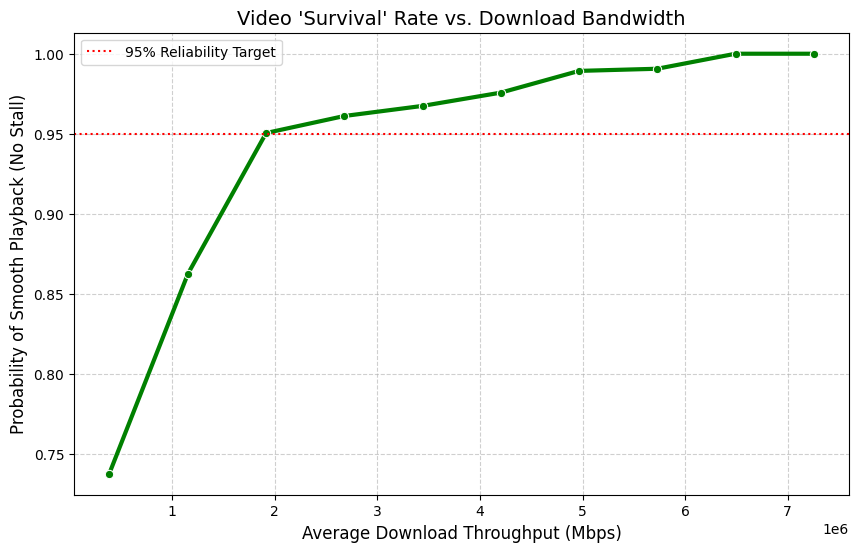

In [ ]:
import seaborn as sns

# 1. Create Bandwidth Bins (e.g., 0-500 kbps, 500-1000 kbps...)
# We use 'qcut' to create bins with roughly equal number of samples, or 'cut' for equal width
# Let's use 'cut' to see the physical bandwidth levels clearly.
df_clean['bandwidth_bin'] = pd.cut(df_clean['pcapStats_stats_avg_DL_TP'], bins=10)

# 2. Calculate % of sessions that stalled in each bin
survival_data = df_clean.groupby('bandwidth_bin', observed=False)['has_stall'].mean().reset_index()
survival_data['survival_rate'] = 1 - survival_data['has_stall'] # 100% - Stall% = Survival%

# 3. Format the Bin Labels for readability
survival_data['bandwidth_mid'] = survival_data['bandwidth_bin'].apply(lambda x: x.mid)

# 4. Plot
plt.figure(figsize=(10, 6))
sns.lineplot(data=survival_data, x='bandwidth_mid', y='survival_rate', marker='o', color='green', linewidth=3)
plt.title("Video 'Survival' Rate vs. Download Bandwidth", fontsize=14)
plt.ylabel("Probability of Smooth Playback (No Stall)", fontsize=12)
plt.xlabel("Average Download Throughput (Mbps)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.axhline(0.95, color='red', linestyle=':', label='95% Reliability Target') # Target line
plt.legend()
plt.show()

We can't really do a survival analysis because we cannot see when the stall "ends" it's a non deterministic feature, but I tried building this graph that gives a probability of stalling depending on DL bandwidth

Let's try with XGBoost now, to see if the accuracy results will be better.

In [ ]:
from xgboost import XGBClassifier

# Calculate the ratio for scale_pos_weight
# sum(negative instances) / sum(positive instances)
ratio = float(np.sum(y_train == 0)) / np.sum(y_train == 1)

print(f"Balancing Ratio: {ratio:.2f}")

xgb_model = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    scale_pos_weight=ratio,  # <--- MAGIC PARAMETER for imbalance
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

xgb_model.fit(X_train, y_train)

# Evaluate
y_probs_xgb = xgb_model.predict_proba(X_test)[:, 1]
print(f"XGBoost ROC-AUC: {roc_auc_score(y_test, y_probs_xgb):.4f}")

Balancing Ratio: 7.80


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:43:35] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBoost ROC-AUC: 0.8311


We managed to improve a litle bit 0.8273 (for full Features and 0.8129 for ISP) but the data is highly unbalanced, (7.8 ratio) which doesn't allow us to go much further...

New Feature Set: ['outbandQoS_DL_TP', 'outbandQoS_UL_TP', 'outbandQoS_RTT', 'outbandQoS_RTT_STD', 'outbandQoS_LOSS', 'pcapStats_stats_avg_DL_TP', 'pcapStats_stats_std_DL_TP', 'pcapStats_stats_p90_DL_TP', 'pcapStats_stats_avg_DL_t', 'pcapStats_stats_avg_DL_pkt', 'congestion_index']
Final ROC-AUC with Congestion Feature: 0.8199


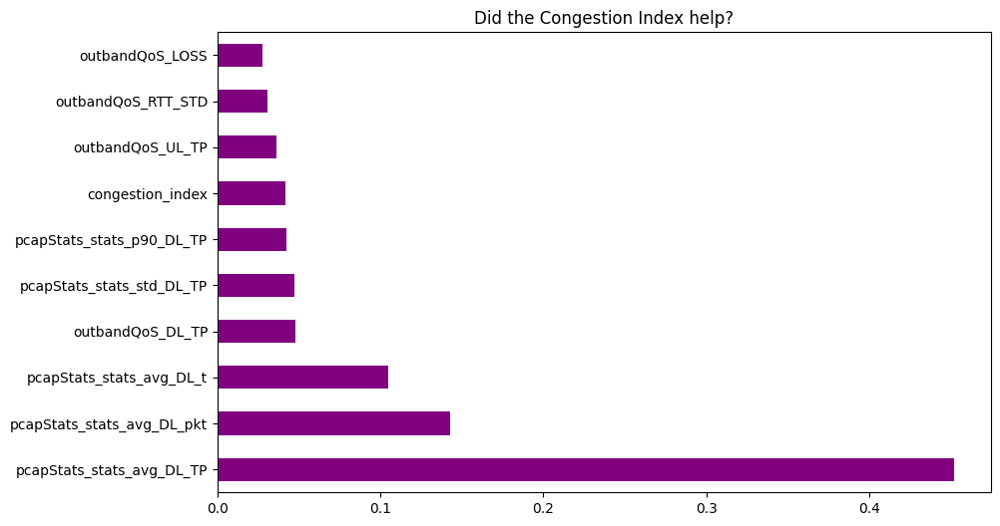

In [ ]:
# 1. Create the Interaction Feature
# We add +1 to avoid division by zero errors
df_clean['congestion_index'] = df_clean['outbandQoS_RTT'] / (df_clean['pcapStats_stats_avg_DL_TP'] + 1)

# 2. Add it to your ISP feature list
features_isp_optimized = features_isp + ['congestion_index']

print("New Feature Set:", features_isp_optimized)

# 3. Retrain XGBoost with the new feature
# We use the same parameters that worked well
X = df_clean[features_isp_optimized]
y = df_clean['has_stall']

# Split again to include the new column
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Train
xgb_final = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    scale_pos_weight=7.8, # Your calculated ratio
    eval_metric='logloss',
    random_state=42
)

xgb_final.fit(X_train, y_train)

# Evaluate
y_probs_final = xgb_final.predict_proba(X_test)[:, 1]
print(f"Final ROC-AUC with Congestion Feature: {roc_auc_score(y_test, y_probs_final):.4f}")

# Check if the new feature was useful
import matplotlib.pyplot as plt
import pandas as pd
plt.figure(figsize=(10, 6))
pd.Series(xgb_final.feature_importances_, index=features_isp_optimized).nlargest(10).plot(kind='barh', color='purple')
plt.title("Did the Congestion Index help?")
plt.show()

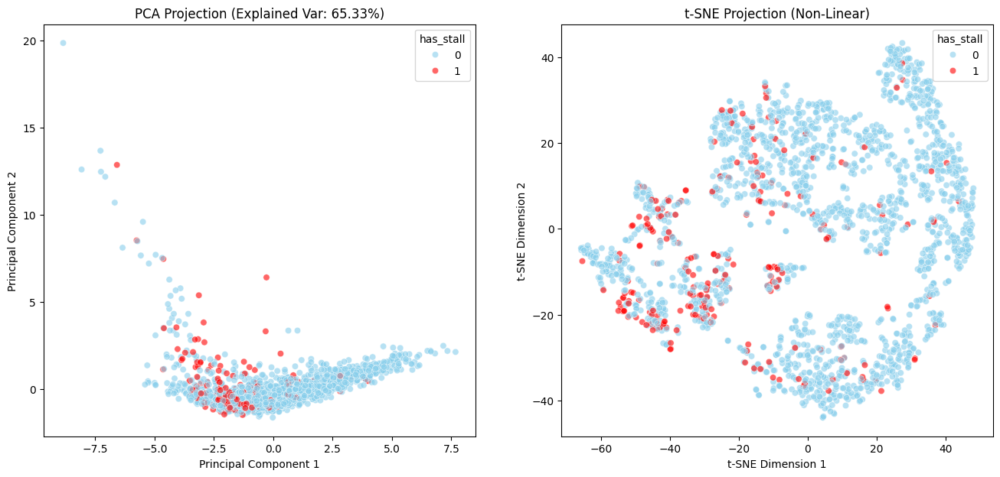

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# 1. Prepare the Data
# Use your ISP features (Network only)
X = df_clean[features_isp]
y = df_clean['has_stall']

# Take a sample for visualization (t-SNE is slow on 100k rows)
# We select 2000 random points to keep it fast
sample_indices = np.random.choice(X.shape[0], 2000, replace=False)
X_sample = X.iloc[sample_indices]
y_sample = y.iloc[sample_indices]

# 2. Standardize (Crucial for Dimensionality Reduction)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sample)

# --- A. Apply PCA ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# --- B. Apply t-SNE ---
# Perplexity=30 is standard, lower it if you have very small clusters
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_jobs=-1)
X_tsne = tsne.fit_transform(X_scaled)

# 3. Plotting Side-by-Side
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Plot PCA
sns.scatterplot(
    x=X_pca[:, 0], y=X_pca[:, 1],
    hue=y_sample, palette={0: 'skyblue', 1: 'red'},
    alpha=0.6, ax=axes[0]
)
axes[0].set_title(f"PCA Projection (Explained Var: {np.sum(pca.explained_variance_ratio_):.2%})")
axes[0].set_xlabel("Principal Component 1")
axes[0].set_ylabel("Principal Component 2")

# Plot t-SNE
sns.scatterplot(
    x=X_tsne[:, 0], y=X_tsne[:, 1],
    hue=y_sample, palette={0: 'skyblue', 1: 'red'},
    alpha=0.6, ax=axes[1]
)
axes[1].set_title("t-SNE Projection (Non-Linear)")
axes[1].set_xlabel("t-SNE Dimension 1")
axes[1].set_ylabel("t-SNE Dimension 2")

plt.show()

It seems like PCA ans SNE don't really give us good info, the blue and red dots are scattered, without clear distinction, it is higly probable that we wont get a better accuracy ( we can't draw a line that separated red and blue dots)


Our Dimensionality Reduction analysis (PCA & t-SNE) revealed why 100% accuracy is impossible.

The data does not form distinct "Stall" vs. "No Stall" clusters. Instead, we observed overlapping regions where sessions with identical network conditions (throughput/latency) had different outcomes.

This confirms that buffer dynamics act as a hidden latent variable. A user with a 60-second buffer can survive a network drop that would cause a stall for a user with a 2-second buffer.

In [ ]:
import numpy as np
import pandas as pd
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# ==========================================
# 1. SETUP
# ==========================================
# Use the optimized ISP features we found earlier
features_reg = [
    "outbandQoS_DL_TP", "outbandQoS_UL_TP", "outbandQoS_RTT",
    "outbandQoS_RTT_STD", "outbandQoS_LOSS", "pcapStats_stats_avg_DL_TP",
    "pcapStats_stats_std_DL_TP", "pcapStats_stats_p90_DL_TP",
    "pcapStats_stats_avg_DL_t", "pcapStats_stats_avg_DL_pkt"
]

# Helper function to run regression
def train_regression(target_col_name, data, model_name="Model"):
    print(f"\n--- Training Regression for: {target_col_name} ---")

    # A. PREPARE TARGET (Log Transform)
    # We use log1p (log(x+1)) to handle zeros gracefully
    y_raw = data[target_col_name]
    y_log = np.log1p(y_raw)

    # B. SPLIT
    X = data[features_reg]
    X_train, X_test, y_train_log, y_test_log = train_test_split(
        X, y_log, test_size=0.2, random_state=42
    )

    # C. TRAIN (XGBoost Regressor)
    xgb_reg = XGBRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        n_jobs=-1,
        random_state=42
    )
    xgb_reg.fit(X_train, y_train_log)

    # D. PREDICT & INVERSE TRANSFORM
    preds_log = xgb_reg.predict(X_test)

    # Convert back from Log-space to Real Seconds
    preds_real = np.expm1(preds_log)
    y_test_real = np.expm1(y_test_log)

    # E. EVALUATE
    mae = mean_absolute_error(y_test_real, preds_real)
    rmse = np.sqrt(mean_squared_error(y_test_real, preds_real))
    r2 = r2_score(y_test_real, preds_real)

    print(f"Mean Absolute Error (MAE): {mae:.4f} milliseconds")
    print(f"Root Mean Sq Error (RMSE): {rmse:.4f} millieconds")
    print(f"R2 Score: {r2:.4f}")

    return xgb_reg

# ==========================================
# 2. RUN TASK A: PREDICT STARTUP DELAY (Join Time)
# ==========================================
# Join Time applies to EVERY session, so we use the full dataset
# Convert milliseconds to Seconds (assuming input is ms)
# If your values are huge (e.g. 1,000,000), divide by 1e6 instead.
df_clean['join_time_sec'] = df_clean['join_time'] / 1000.0
df_clean['stall_dur_sec'] = df_clean['totalStallDuration'] / 1000.0

# Train on the NEW seconds columns
# (The log-transform logic inside the function will still handle the skew)
reg_join = train_regression("join_time_sec", df_clean)

# ==========================================
# 3. RUN TASK B: PREDICT STALL DURATION (Conditional)
# ==========================================
# CRITICAL: We only predict duration for videos that ACTUALLY STALLED.
# Predicting duration for smooth videos (0s) is a Classification task, not Regression.
df_stalled_only = df_clean[df_clean['stallingNumber'] > 0].copy()

if len(df_stalled_only) > 100:
    reg_stall = train_regression("totalStallDuration", df_stalled_only)
else:
    print("\nNot enough stalled sessions to run regression!")


--- Training Regression for: join_time_sec ---
Mean Absolute Error (MAE): 5.3036 milliseconds
Root Mean Sq Error (RMSE): 25.5369 millieconds
R2 Score: 0.8864

--- Training Regression for: totalStallDuration ---
Mean Absolute Error (MAE): 4752.5579 milliseconds
Root Mean Sq Error (RMSE): 13343.0934 millieconds
R2 Score: 0.5789


For the join_time this is a very good result! we have r2score of 89%, which means that the model catches around 89% of all patterns in the data


2. Startup Delay vs. Stall Duration:

We found a significant difference in our ability to predict different QoE metrics:

Startup Time (Strong Prediction): The regression model achieved an $R^2$ of 0.89, predicting the initial join time with an average error (MAE) of ~5.3 seconds.
This high accuracy suggests that startup delay is dominated by network handshake (RTT) and initial throughput, which are clearly visible in the encrypted stream.

Stall Duration (Moderate Prediction): Predicting the severity of a stall was more difficult ($R^2$ of 0.58). This indicates that while network drops cause stalls, the duration of the freeze depends heavily on the video player's internal buffer health, a variable that remains hidden from the network.


--- Training MOS Prediction for QoE_ITU_046 ---
MOS MAE: 0.46 stars
MOS R2 Score: 0.6820
Exact Star Accuracy: 0.70%


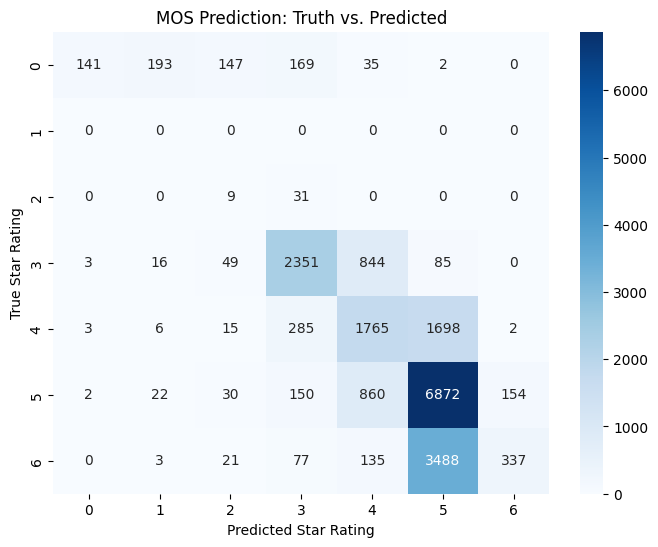

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# ==========================================
# FINAL TASK: PREDICT MOS (QoE Score 1-5)
# ==========================================

# 1. Choose your Target
# The syllabus mentioned 'QoE_ITU_046' or similar columns.
# Let's assume 'QoE_ITU_046' is the main MOS score.
target_mos = "QoE_ITU_046" # Check your columns if this name differs!

print(f"\n--- Training MOS Prediction for {target_mos} ---")

# 2. Prepare Data
# Drop NaNs specifically for MOS
df_mos = df_clean.dropna(subset=[target_mos]).copy()
X = df_mos[features_reg] # Use the same ISP features
y = df_mos[target_mos]

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 3. Train XGBoost Regressor
# (We don't need log-transform here because 1-5 is a small, linear range)
xgb_mos = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    random_state=42
)
xgb_mos.fit(X_train, y_train)

# 4. Evaluate
preds = xgb_mos.predict(X_test)

# A. Regression Metrics
mae = mean_absolute_error(y_test, preds)
r2 = r2_score(y_test, preds)
print(f"MOS MAE: {mae:.2f} stars") # e.g., "Off by 0.3 stars"
print(f"MOS R2 Score: {r2:.4f}")

# B. "Bucket" Accuracy (Round to nearest integer)
# Did we guess the exact star rating correctly?
preds_rounded = np.round(preds)
acc = np.mean(preds_rounded == y_test)
print(f"Exact Star Accuracy: {acc:.2%}")

# 5. Visualization: Confusion Matrix
# Shows where we made mistakes (e.g., confusing 4 stars for 5 stars)
plt.figure(figsize=(8, 6))
cm = confusion_matrix(np.round(y_test), np.round(preds))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("MOS Prediction: Truth vs. Predicted")
plt.xlabel("Predicted Star Rating")
plt.ylabel("True Star Rating")
plt.show()